# Predicting Vehicle Prices Using Regression Models

## **Objectives**  
The primary goal of this project is to develop a robust regression model to predict used car prices for a reseller based on various listed features and specifications. In addition to predicting prices, the project focuses on identifying feature importance and mitigating overfitting through the application of regularisation techniques.

There can be several business objectives for this, such as:

* **Price Prediction**: Model car prices based on features like mileage, fuel type, and performance.
* **Market Analysis**: Explore trends and preferences in the used car market, by type, region, or other metrics.
* **Feature Importance**: Identify the most important factors influencing car prices (e.g., fuel type, mileage, age).

### **Tasks Overview**
The data pipeline for this task involves the following steps:  
1. **Dataset Overview**   
2. **Data Preprocessing**
3. **Data Visualisation & Exploration**
4. **Model Building**
3. **Regularisation**

## **1 Data Understanding**

| **Variable** | **Description** |
--------|--------------|
| `make_model` | The brand and model of the vehicle (e.g., 'Audi A1'). |
| `body_type` | The body style of the vehicle, such as Sedan, Compact, or Station Wagon. |
| `price`  | The listed price of the car in currency. |
| `vat`  | Indicates the VAT status for the vehicle's price (e.g., VAT deductible, Price negotiable). |
| `km` | The total mileage (in kilometers) of the vehicle, indicating its usage. |
| `Type` | Condition of the vehicle, whether it's 'Used' or 'New'.|
| `Fuel` | Type of fuel the vehicle uses, such as 'Diesel', 'Benzine', etc. |
| `Gears` | The number of gears in the vehicle's transmission. |
| `Comfort_Convenience` | Comfort and convenience features, such as 'Air conditioning', 'Leather steering wheel', 'Cruise control', and more. |
| `Entertainment_Media` | Media features available in the vehicle, including 'Bluetooth', 'MP3', 'Radio', etc. |
| `Extras` | Additional features like 'Alloy wheels', 'Sport suspension', etc.|
| `Safety_Security` | Safety features like 'ABS', 'Airbags', 'Electronic stability control', 'Isofix', etc.  |
| `age` | Age of the car (calculated based on the model year). |
| `Previous_Owners`| The number of previous owners the car has had. |
| `hp_kW` | Engine power in kilowatts (kW), indicating the performance capacity of the engine.|
| `Inspection_new` | Indicates whether the car has recently undergone an inspection (1 for yes, 0 for no). |
| `Paint_Type`| The type of paint on the car, such as 'Metallic', 'Matte', etc. |
| `Upholstery_type` | The material used for the interior upholstery, such as 'Cloth', 'Leather', etc.|
| `Gearing_Type` | The type of transmission the car uses, either 'Automatic' or 'Manual'. |
| `Displacement_cc` | The engine displacement in cubic centimeters (cc), indicating the size of the engine.|
| `Weight_kg` | The total weight of the vehicle in kilograms.|
| `Drive_chain` | The type of drivetrain, indicating whether it's 'Front' or 'Rear' wheel drive. |
| `cons_comb`  | The combined fuel consumption in liters per 100 kilometers.|

### **1.1 Data Loading**

**Importing Necessary Libraries**

In [1]:
# Importing necessary libraries
# Data Manipulation
import pandas as pd
import numpy as np

# Visualizatuion
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
%matplotlib inline

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Model Building
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression, Ridge, Lasso

# Model Evaluation
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Logging
import logging

import os





In [2]:
# Configurable settings
pd.set_option('display.max_columns', None) # Display all columns
pd.set_option('display.max_rows',100) # Display up to 100 rows
pd.set_option('display.float_format', lambda x: '%.3f' % x) # Format floats to 4 decimal places

In [3]:
print(os.getcwd())  # Check current working directory


/content


In [4]:
# Setup basic logging
logging.basicConfig(
    filename='/content/sample_data/Car_Price/car_price_prediction.log',
    level=logging.INFO,
    format='%(asctime)s:%(levelname)s:%(message)s',
    filemode='w'
)



In [5]:
def my_log(title, message):
    '''
        Custom log function to log title and message with formatting.
        Input : Title, Message
        Output: None
    '''
    logging.info('*' * 50)
    logging.info(f"{title}")
    logging.info('*' * 50)
    logging.info(f"{message}")
    print(f"{title} \n {message}")


In [6]:
my_log("Logging SetUp","Logging Set up completed")

Logging SetUp 
 Logging Set up completed


#### **1.1.1**
Load the dataset

In [7]:
# Load the dataset
try:
  car_df = pd.read_csv('/content/sample_data/Car_Price/Car_Price_data.csv')
  message=f'Car Price dataset loaded successfully --> {car_df.shape}'
  my_log("Dataset Loaded Successfully", message)

except Exception as e:
  message=f'Error loading dataset: {e}'
  my_log("Dataset Load Failed", message)


Dataset Loaded Successfully 
 Car Price dataset loaded successfully --> (15915, 23)


## **2 Analysis and Feature Engineering** <font color =red> [35 marks] </font>



### **2.1 Preliminary Analysis and Frequency Distributions** <font color = red> [13 marks] </font>

#### **2.1.1** <font color =red> [1 marks] </font>
Check and fix missing values.

In [8]:
def missing_values(df):
    '''
        Function to calculate missing values in each column of the dataframe.
        Input : DataFrame
        Output: DataFrame with missing value count and percentage
    '''
    missing_counts = df.isnull().sum()
    missing_percent = (missing_counts / len(df)) * 100
    missing_df =  pd.DataFrame({
        'Column_name' : missing_counts.index,
        'Missing_count': missing_counts.values,
        'Missing_percentage': missing_percent.values
    })
    missing_df.sort_values(by='Missing_percentage', ascending=False, inplace=True)
    return missing_df

In [9]:
# Find the proportion of missing values in each column and handle if found
missing_df = missing_values(car_df)
my_log("Missing Values in Dataset", f"\n{missing_df}")

# Check for missing rows
missing_rows_count = car_df.isnull().all(axis=1).sum()
my_log("Missing Rows Count", f"\n\nNumber of rows with all values missing: {missing_rows_count}")

Missing Values in Dataset 
 
            Column_name  Missing_count  Missing_percentage
0            make_model              0               0.000
1             body_type              0               0.000
2                 price              0               0.000
3                   vat              0               0.000
4                    km              0               0.000
5                  Type              0               0.000
6                  Fuel              0               0.000
7                 Gears              0               0.000
8   Comfort_Convenience              0               0.000
9   Entertainment_Media              0               0.000
10               Extras              0               0.000
11      Safety_Security              0               0.000
12                  age              0               0.000
13      Previous_Owners              0               0.000
14                hp_kW              0               0.000
15       Inspection_new    

In [10]:
# Check dtypes for columns
my_log("Data Types of Columns", f"\n{car_df.info()}")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15915 non-null  object 
 1   body_type            15915 non-null  object 
 2   price                15915 non-null  int64  
 3   vat                  15915 non-null  object 
 4   km                   15915 non-null  float64
 5   Type                 15915 non-null  object 
 6   Fuel                 15915 non-null  object 
 7   Gears                15915 non-null  float64
 8   Comfort_Convenience  15915 non-null  object 
 9   Entertainment_Media  15915 non-null  object 
 10  Extras               15915 non-null  object 
 11  Safety_Security      15915 non-null  object 
 12  age                  15915 non-null  float64
 13  Previous_Owners      15915 non-null  float64
 14  hp_kW                15915 non-null  float64
 15  Inspection_new       15915 non-null 

In [11]:
# Convert all object columns to category
object_cols = car_df.select_dtypes(include='object').columns
additional_cols = pd.Index(['Previous_Owners', 'Inspection_new', 'Gears'])
category_cols =object_cols.append(additional_cols)
car_df[category_cols] = car_df[category_cols].astype('category')
my_log("Converted Columns to Category", f"Converted columns: {category_cols.tolist()}\n\n")
my_log("Data Types after Conversion", f"\n{car_df.info()}")

Converted Columns to Category 
 Converted columns: ['make_model', 'body_type', 'vat', 'Type', 'Fuel', 'Comfort_Convenience', 'Entertainment_Media', 'Extras', 'Safety_Security', 'Paint_Type', 'Upholstery_type', 'Gearing_Type', 'Drive_chain', 'Previous_Owners', 'Inspection_new', 'Gears']


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   make_model           15915 non-null  category
 1   body_type            15915 non-null  category
 2   price                15915 non-null  int64   
 3   vat                  15915 non-null  category
 4   km                   15915 non-null  float64 
 5   Type                 15915 non-null  category
 6   Fuel                 15915 non-null  category
 7   Gears                15915 non-null  category
 8   Comfort_Convenience  15915 non-null  category
 9   Entertainment_Media  15915 non-null 

In [12]:
#Column name are inconsistent - Capitalize
my_log("Column Names Before Capitalize", f'\n{car_df.columns}\n\n')
car_df.columns = car_df.columns.str.capitalize()
my_log("Column Names After Capitalize", f'\n{car_df.columns}\n\n')

Column Names Before Capitalize 
 
Index(['make_model', 'body_type', 'price', 'vat', 'km', 'Type', 'Fuel',
       'Gears', 'Comfort_Convenience', 'Entertainment_Media', 'Extras',
       'Safety_Security', 'age', 'Previous_Owners', 'hp_kW', 'Inspection_new',
       'Paint_Type', 'Upholstery_type', 'Gearing_Type', 'Displacement_cc',
       'Weight_kg', 'Drive_chain', 'cons_comb'],
      dtype='object')


Column Names After Capitalize 
 
Index(['Make_model', 'Body_type', 'Price', 'Vat', 'Km', 'Type', 'Fuel',
       'Gears', 'Comfort_convenience', 'Entertainment_media', 'Extras',
       'Safety_security', 'Age', 'Previous_owners', 'Hp_kw', 'Inspection_new',
       'Paint_type', 'Upholstery_type', 'Gearing_type', 'Displacement_cc',
       'Weight_kg', 'Drive_chain', 'Cons_comb'],
      dtype='object')




In [13]:
# Check for duplicates
my_log("Count of Duplicates Before Removal", f'Before | Count of duplicates :{car_df.duplicated().sum()}')
car_df.drop_duplicates(keep='first',inplace=True)
my_log("Count of Duplicates After Removal", f'After | Count of duplicates :{car_df.duplicated().sum()}')

Count of Duplicates Before Removal 
 Before | Count of duplicates :1673
Count of Duplicates After Removal 
 After | Count of duplicates :0


In [14]:
# Basic statistics summary of Numerical features
car_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,14242.000,18100.969,7421.214,4950.000,12950.000,16950.000,21900.000,74600.000
Km,14242.000,32582.110,36856.863,0.000,3898.000,21000.000,47000.000,317000.000
Age,14242.000,1.415,1.110,0.000,0.000,1.000,2.000,3.000
Hp_kw,14242.000,88.713,26.548,40.000,66.000,85.000,103.000,294.000
Displacement_cc,14242.000,1432.890,277.507,890.000,1229.000,1461.000,1598.000,2967.000
Weight_kg,14242.000,1342.399,201.247,840.000,1165.000,1320.000,1487.000,2471.000
Cons_comb,14242.000,4.825,0.862,3.000,4.100,4.800,5.400,9.100


In [15]:
# Basic statistics summary of Object features
car_df.describe(include=['category']).T

,count,unique,top,freq
Make_model,14242,9,Audi A3,2758
Body_type,14242,8,Sedans,7230
Vat,14242,2,VAT deductible,13426
Type,14242,5,Used,10172
Fuel,14242,4,Benzine,7558
Gears,14242.000,4.000,6.000,7764.000
Comfort_convenience,14242,6196,"Air conditioning,Electrical side mirrors,Hill ...",312
Entertainment_media,14242,346,"Bluetooth,Hands-free equipment,On-board comput...",1562
Extras,14242,659,Alloy wheels,5010
Safety_security,14242,4442,"ABS,Central door lock,Daytime running lights,D...",635


**From the features, identify the target feature and numerical and categorical predictors. Select the numerical and categorical features carefully as they will be used in analysis.**

#### **2.1.2** <font color =red> [3 marks] </font>
Identify numerical predictors and plot their frequency distributions.

In [16]:
# Identify numerical features and plot histograms
numerical_predictor = car_df.select_dtypes(include=['int64','float64']).columns.drop('Price')
target = 'Price'
categorical_predictor = car_df.select_dtypes(include=['category']).columns.tolist()
my_log("Numerical Predictor", f'\ntarget: {target}\nNumerical Predictor : {numerical_predictor.tolist()}\nCategorical Predictor : {categorical_predictor}')


Numerical Predictor 
 
target: Price
Numerical Predictor : ['Km', 'Age', 'Hp_kw', 'Displacement_cc', 'Weight_kg', 'Cons_comb']
Categorical Predictor : ['Make_model', 'Body_type', 'Vat', 'Type', 'Fuel', 'Gears', 'Comfort_convenience', 'Entertainment_media', 'Extras', 'Safety_security', 'Previous_owners', 'Inspection_new', 'Paint_type', 'Upholstery_type', 'Gearing_type', 'Drive_chain']


In [17]:
def numerical_feature_stat(series, name=None, round_digits=3):
    '''
    Generate statistical summary for numerical feature
    '''
    import numpy as np

    name = name or series.name
    series = series.dropna()

    mean_val     = series.mean()
    median_val   = series.median()
    mode_val     = series.mode()[0]
    std_val      = series.std()
    var_val      = series.var()
    range_val    = series.max() - series.min()
    q1           = series.quantile(0.25)
    q3           = series.quantile(0.75)
    iqr          = q3 - q1
    cv           = std_val / mean_val
    skew_val     = series.skew()
    kurt_val     = series.kurtosis()
    missing_pct  = series.isna().mean() * 100
    unique_vals  = series.nunique()

    # Standard deviation thresholds
    std_1_lower  = mean_val - std_val
    std_1_upper  = mean_val + std_val
    std_2_lower  = mean_val - 2 * std_val
    std_2_upper  = mean_val + 2 * std_val

    summary = f"""
 Statistical Summary for '{name}'

- Count: {len(series)}
- Missing %: {round(missing_pct, round_digits)}%
- Unique Values: {unique_vals}
- Mean: {round(mean_val, round_digits)}
- Median: {round(median_val, round_digits)}
- Mode: {round(mode_val, round_digits)}
- Std Dev: {round(std_val, round_digits)}
- Variance: {round(var_val, round_digits)}
- Range: {round(range_val, round_digits)}
- Q1 (25th percentile): {round(q1, round_digits)}
- Q3 (75th percentile): {round(q3, round_digits)}
- IQR (Q3 - Q1): {round(iqr, round_digits)}
- Coefficient of Variation (CV): {round(cv, round_digits)}
- Skewness: {round(skew_val, round_digits)}
- Kurtosis: {round(kurt_val, round_digits)}
- ±1σ Range: [{round(std_1_lower, round_digits)}, {round(std_1_upper, round_digits)}]
- ±2σ Range: [{round(std_2_lower, round_digits)}, {round(std_2_upper, round_digits)}]
"""
    return summary.strip()

In [18]:
def plot_distribution_summary(series, title ,hist_color, kde_color='red'):
    '''
    Scope: Plot Sereis for numerical predictors
    Input:Series and formatting option
    Output:None
   '''

    # Statistical calculation
    stat=numerical_feature_stat(series,title)
    #print(stat)
    # Layout
    fig = plt.figure(figsize=(18,5))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 2])
    ax_text = fig.add_subplot(gs[0])
    ax_plot = fig.add_subplot(gs[1])

    ax_text.axis('off')
    ax_text.text(0,1, stat, fontsize=12, va='top' , ha='left', family='monospace')

    #plot series
    sns.histplot(series, kde=False,color=hist_color,stat='density', ax=ax_plot)
    sns.kdeplot(series, color=kde_color, linewidth=2, linestyle='--', ax=ax_plot)

    # Annotate central tendencies
    ax_plot.axvline(series.mean(), color='blue', linestyle='--', label=f'Mean: {series.mean():,.0f}')
    ax_plot.axvline(series.median(), color='green', linestyle='--', label=f'Median: {series.median():,.0f}')
    ax_plot.axvline(series.mode()[0], color='black', linestyle='--', label=f'Mode: {series.mode()[0]:,.0f}')
    ax_plot.legend(loc='upper right', fontsize=9)

    ax_plot.set_title(f'Distribution of {title}', fontsize=14, weight='bold')
    ax_plot.set_xlabel(series.name, fontsize=12)
    ax_plot.set_ylabel('Density', fontsize=12)
    ax_plot.grid(True, linestyle='--', alpha=0.5)

    ax_plot.set_title(f'Distribution of {title}', fontsize=14, weight='bold')
    ax_plot.set_xlabel(series.name, fontsize=12)
    ax_plot.set_ylabel('Density', fontsize=12)
    ax_plot.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

Distribution of Km 
 Distribution of Km


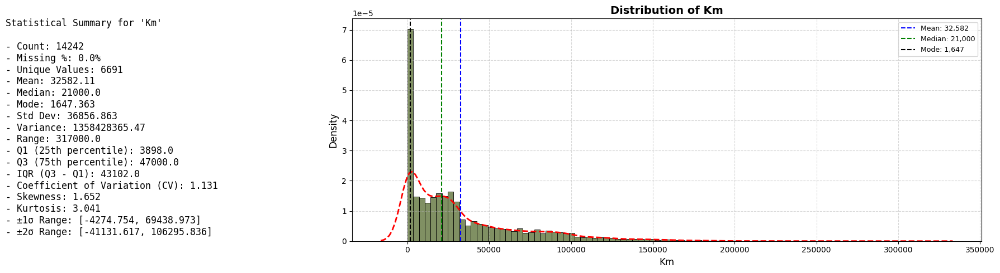

Distribution of Age 
 Distribution of Age


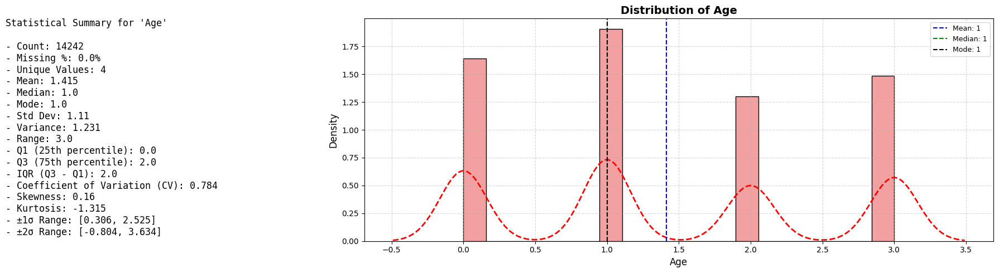

Distribution of Hp_kw 
 Distribution of Hp_kw


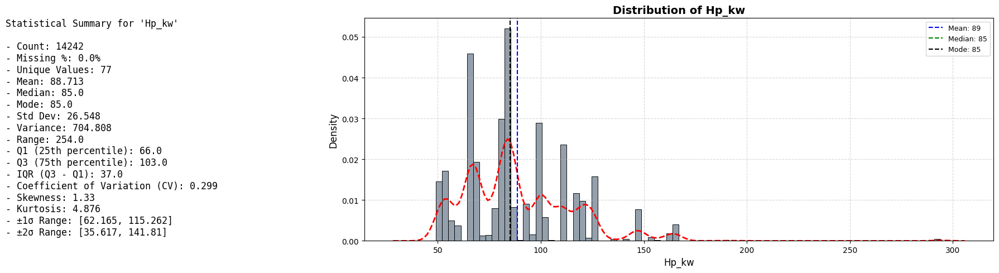

Distribution of Displacement_cc 
 Distribution of Displacement_cc


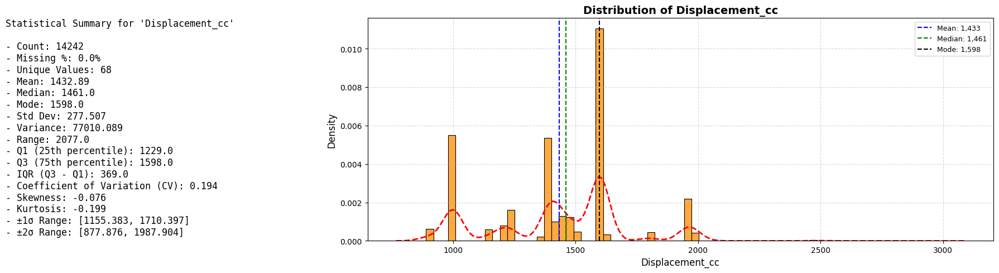

Distribution of Weight_kg 
 Distribution of Weight_kg


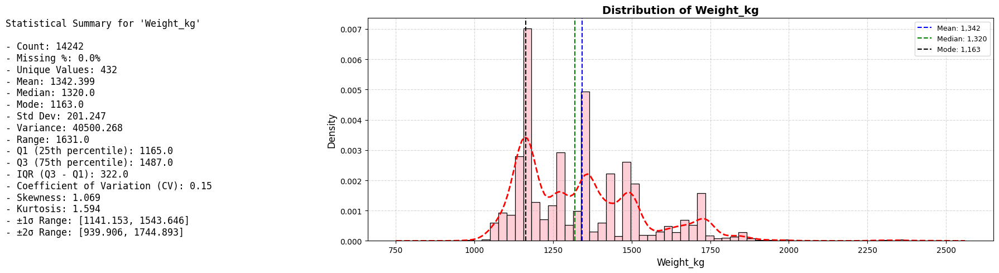

Distribution of Cons_comb 
 Distribution of Cons_comb


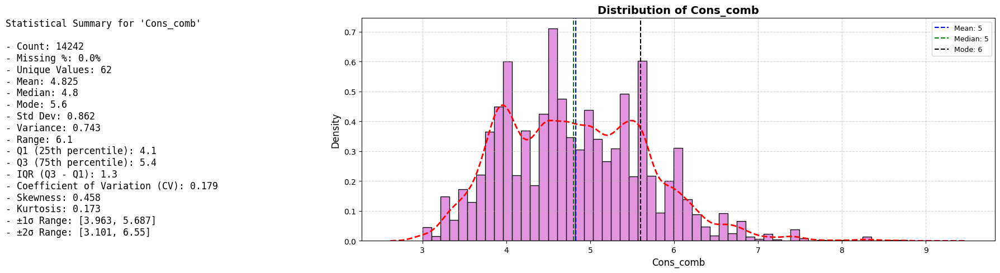

In [19]:
feature_config = {
    'Km': 'darkolivegreen',
    'Age': 'lightcoral',
    'Hp_kw': 'slategray',
    'Displacement_cc': 'darkorange',
    'Weight_kg': 'pink',
    'Cons_comb': 'orchid'
}

for feature, color in feature_config.items():
    my_log(f'Distribution of {feature}',f'Distribution of {feature}')
    plot_distribution_summary(car_df[feature], feature, hist_color=color)

#### **2.1.3** <font color =red> [3 marks] </font>
Identify categorical predictors and plot their frequency distributions.

In [20]:
def categorical_feature_stat(series, name=None, round_digits=3):
    '''
    Generate statistical summary for Categorical feature
    Input : Series column , name : optional
    Output : statistical summary
    '''
    value_counts = series.value_counts()
    total = len(series)
    missing = series.isna().sum()
    unique = series.nunique()
    top_category = value_counts.idxmax()
    top_count = value_counts.max()
    top_pct = round(top_count / total * 100, round_digits)
    freq_table = value_counts.to_frame(name='Count')
    freq_table['Percentage'] = (freq_table['Count'] / total * 100).round(round_digits)
    coverage_80 = value_counts.cumsum().searchsorted(0.8 * total)

    summary = f"""
 Categorical Summary{' for ' + name if name else ''}

- Total Entries: `{total}`
- Missing Values: `{missing}` (`{(missing / total * 100):.{round_digits}f}%`)
- Unique Categories: `{unique}`
- Top Category: `{top_category}`
  - Count: `{top_count}`
  - Percentage: `{top_pct}%`
- Coverage: Top `{coverage_80}` \n categories cover 80% of the data

Frequency Table (Top Categories)
{freq_table.head(10).to_markdown()}

"""
    return summary



In [21]:
def plot_cat_distribution_summary(series, title="Category Distribution", palette='Set2', round_digits=2):
    '''
    plot categorical distribution
    Input: Pandas Series, optional title and palette
    Output: None
    '''
    # Generate markdown summary
    cat_stat = categorical_feature_stat(series, name=series.name, round_digits=round_digits)

    # Setup layout
    fig = plt.figure(figsize=(20, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 2])
    ax_text = fig.add_subplot(gs[0])
    ax_plot = fig.add_subplot(gs[1])

    # Render markdown-style text
    ax_text.axis('off')
    ax_text.text(0, 1, cat_stat, fontsize=12, va='top', ha='left', family='monospace')

    # Plot countplot with enhancements
    sns.countplot(x=series, order=series.value_counts().index, palette=palette, ax=ax_plot)
    ax_plot.set_title(title, fontsize=14, weight='bold')
    ax_plot.set_xlabel(series.name if series.name else "Category", fontsize=12)
    ax_plot.set_ylabel("Count", fontsize=12)
    ax_plot.set_xticklabels(ax_plot.get_xticklabels(), rotation=45, ha='right')

    # Annotate bars with percentages
    total = len(series)
    for p in ax_plot.patches:
        height = p.get_height()
        pct = f'{100 * height / total:.{round_digits}f}%'
        ax_plot.annotate(pct, (p.get_x() + p.get_width() / 2., height),
                         ha='center', va='bottom', fontsize=10, color='black')

    plt.tight_layout()
    plt.show()

Distribution of Make_model 
 Make_model


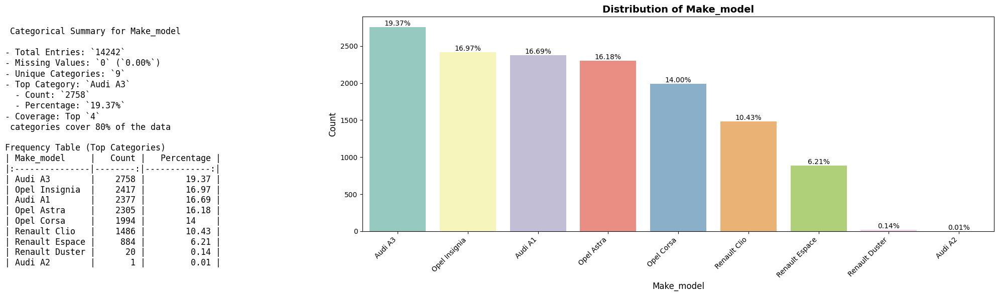

Distribution of Body_type 
 Body_type


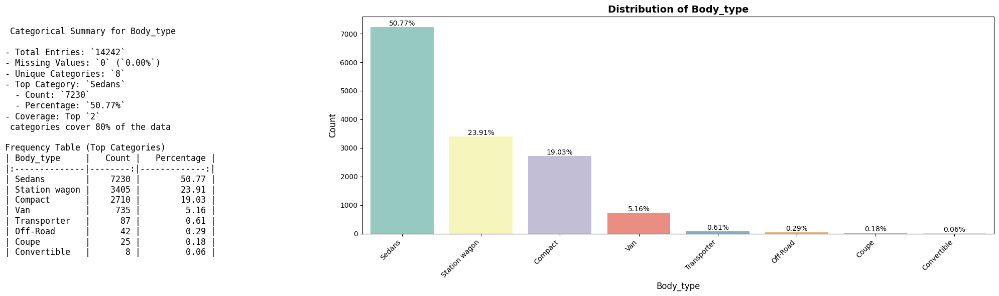

Distribution of Vat 
 Vat


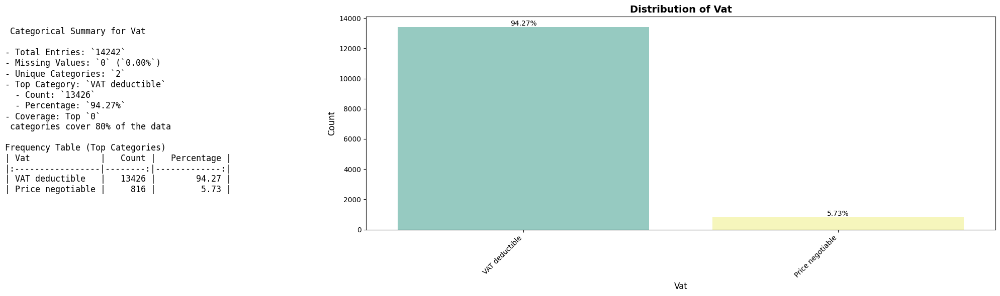

Distribution of Type 
 Type


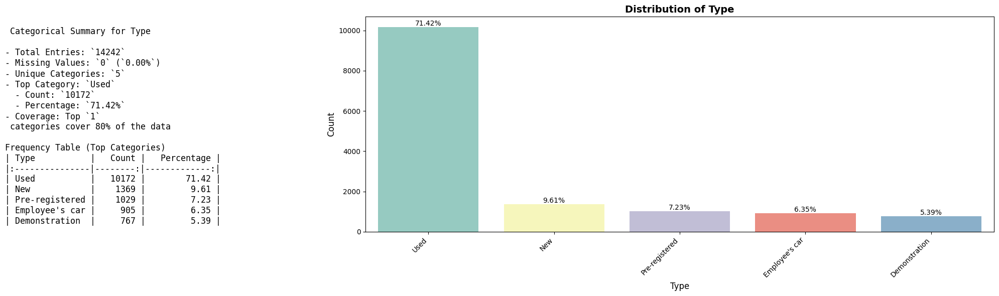

Distribution of Fuel 
 Fuel


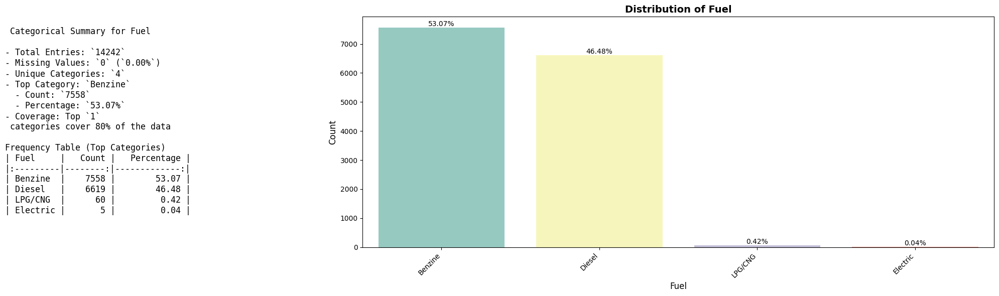

Distribution of Gears 
 Gears


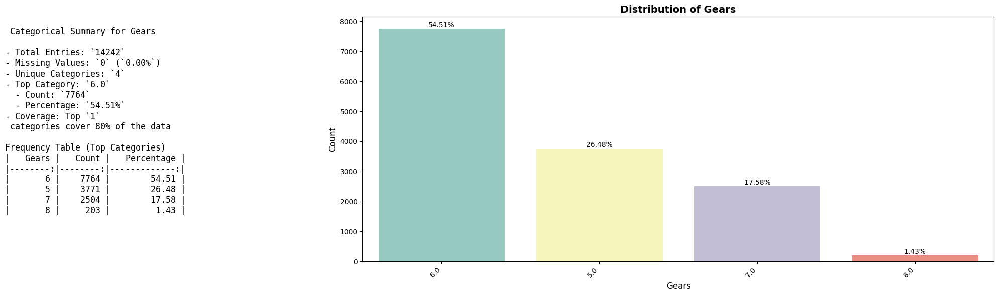

Distribution of Comfort_convenience 
 Comfort_convenience


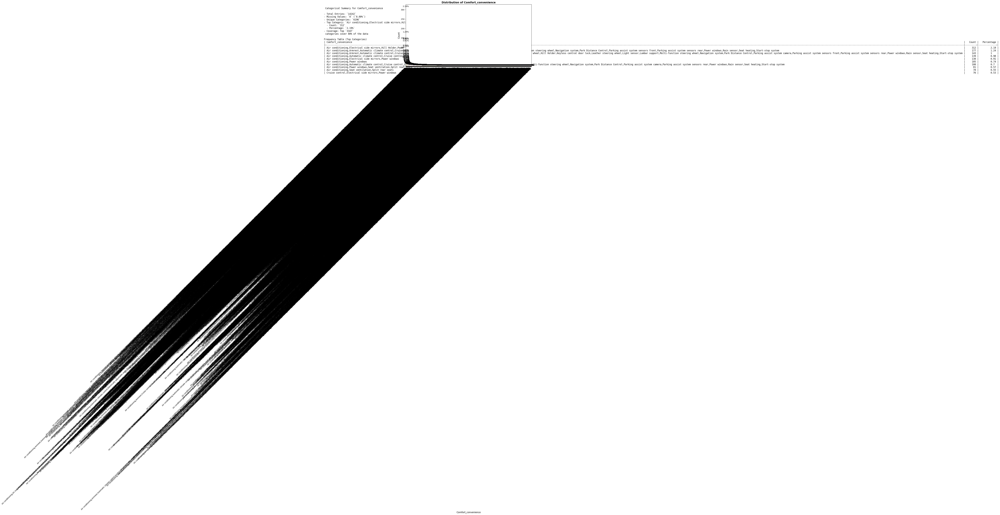

Distribution of Entertainment_media 
 Entertainment_media


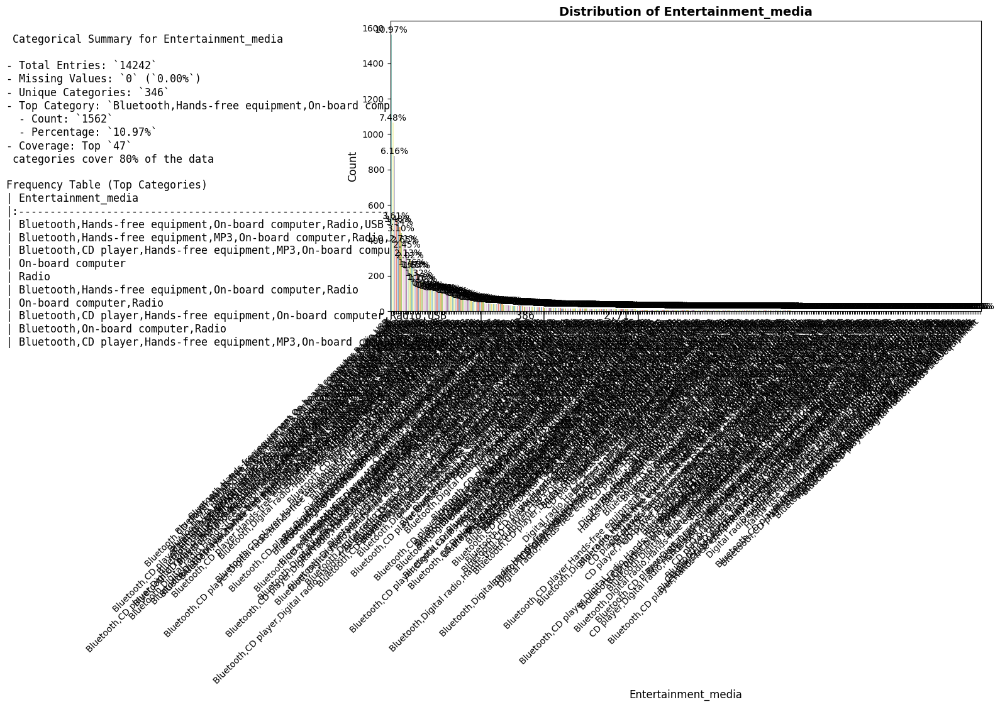

Distribution of Extras 
 Extras


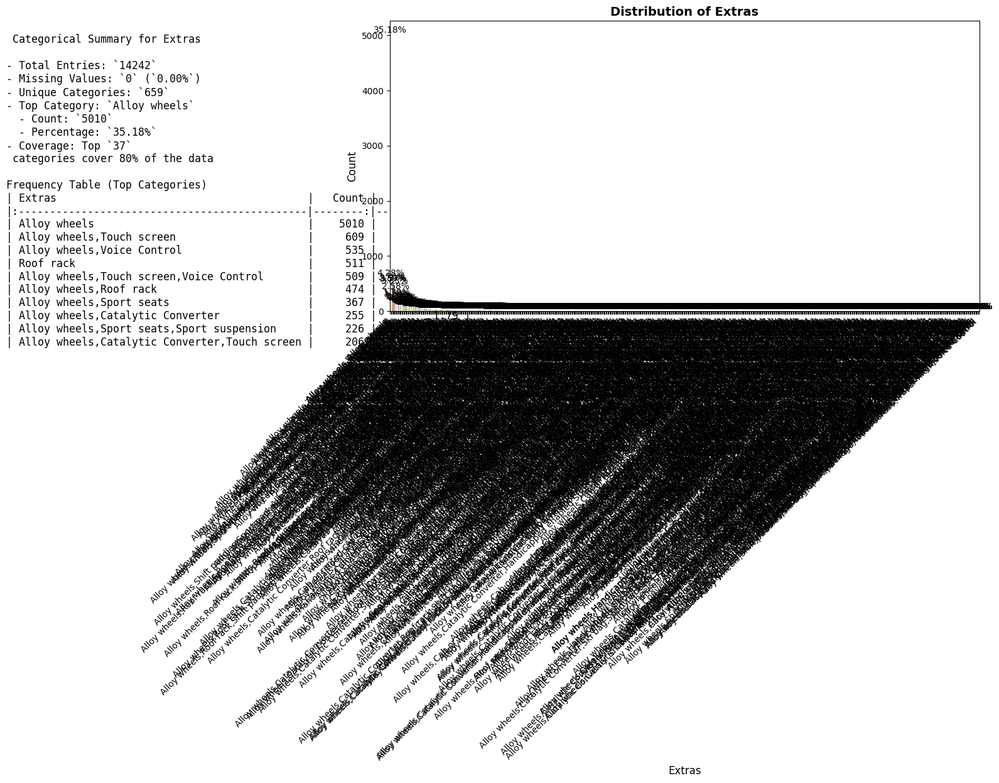

Distribution of Safety_security 
 Safety_security


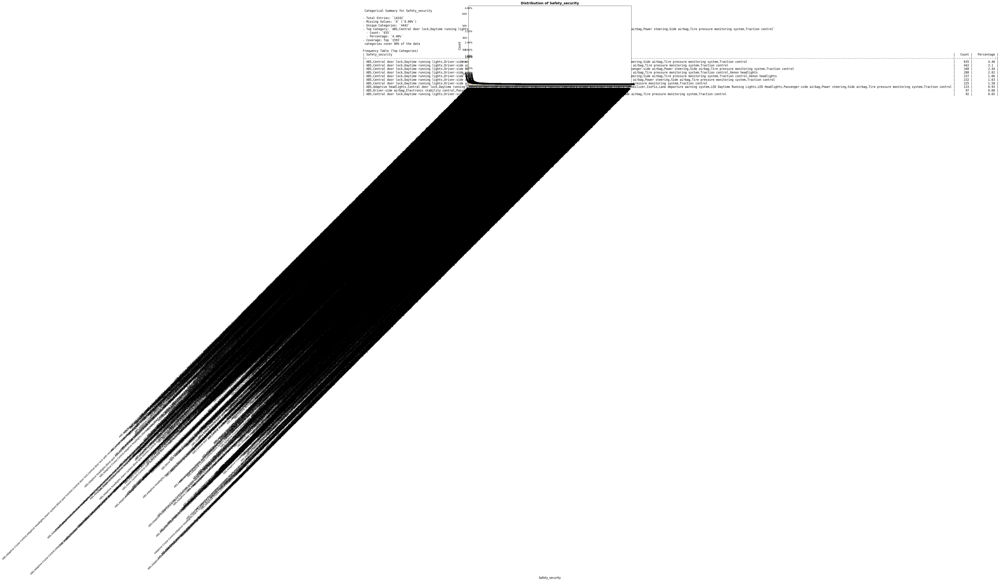

Distribution of Previous_owners 
 Previous_owners


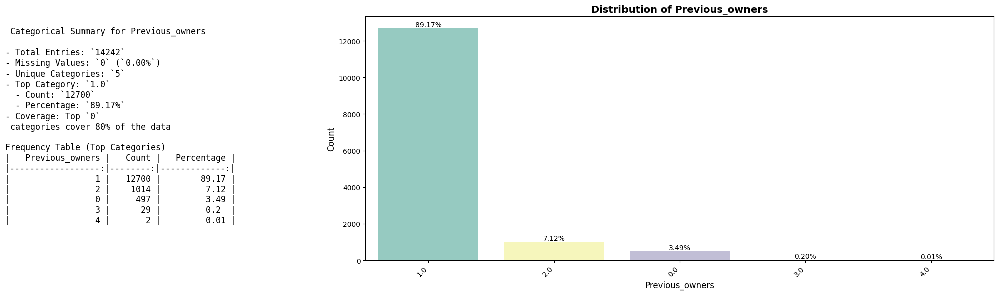

Distribution of Inspection_new 
 Inspection_new


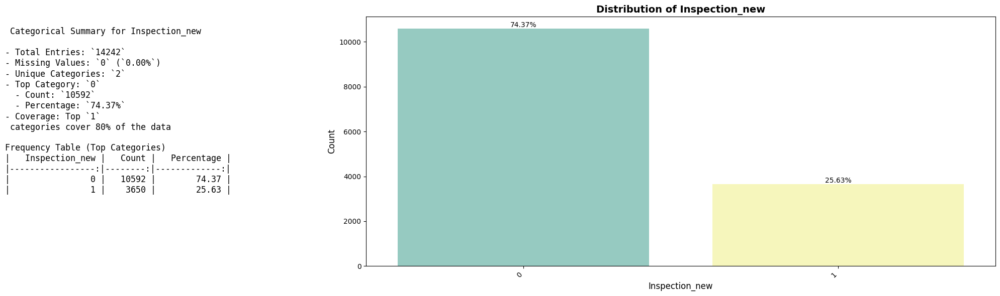

Distribution of Paint_type 
 Paint_type


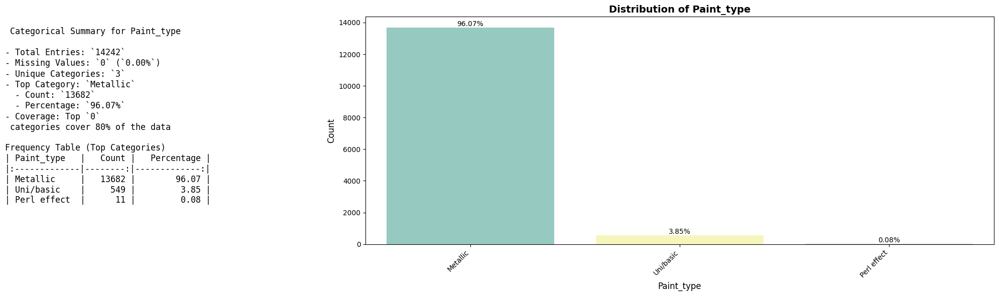

Distribution of Upholstery_type 
 Upholstery_type


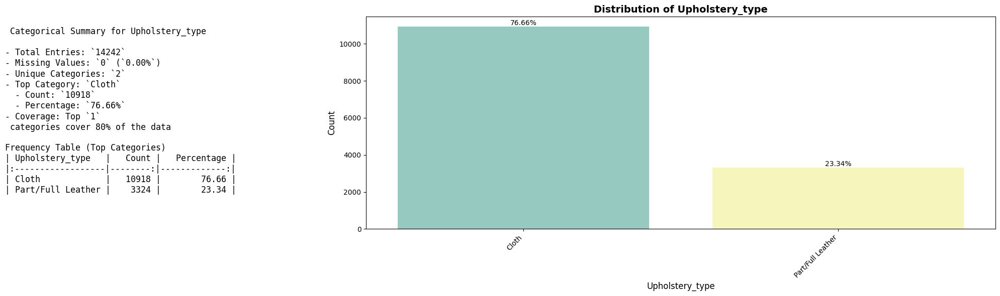

Distribution of Gearing_type 
 Gearing_type


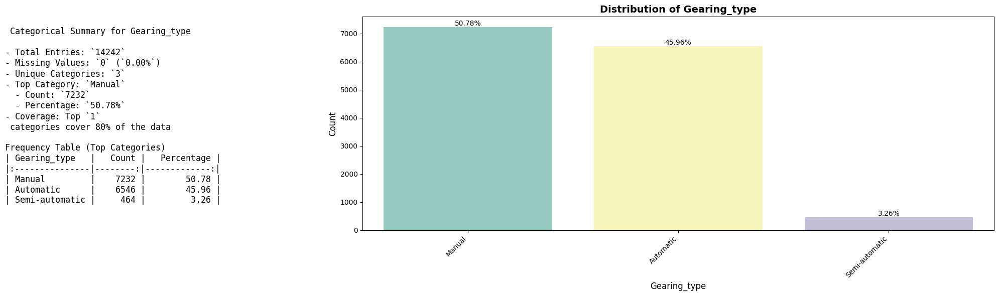

Distribution of Drive_chain 
 Drive_chain


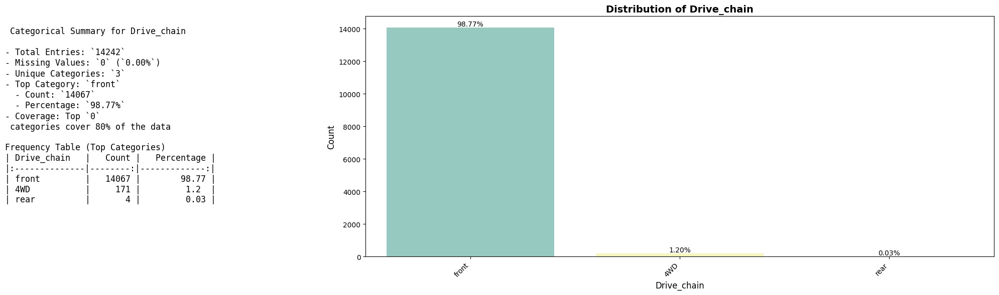

In [22]:
# Identify categorical columns and check their frequency distributions
# Loop throught categorical predictor
for cat_col in categorical_predictor:
    my_log(f"Distribution of {cat_col}",cat_col)
    plot_cat_distribution_summary(car_df[cat_col], title=f'Distribution of {cat_col}', palette='Set3')



**Note**: Look carefully at the values stored in columns `["Comfort_Convenience", "Entertainment_Media", "Extras", "Safety_Security"]`.

Should they be considered categorical? Should they be dropped or handled any other way?

#### **2.1.4** <font color =red> [3 marks] </font>
Fix columns with low frequency values and class imbalances.

Some information regarding values in the `Type` column that may help:
- *'Pre-registered'* cars are ones which have already been registered previously by the seller.
- *'New'* cars are not necessarily new cars, but new-like cars. These might also have multiple owners due to multiple pre-registrations as well.
- *'Employee's car'* are cars used by employees over a short period of time and small distance.
- *'Demonstration'* cars are used for trial purposes and also driven for a short time and distance.

Based on these, you can handle this particular column. For other columns, decide a strategy on your own.

In [23]:
# Fix columns as needed
## Fixing column | Type
my_log("Feature | Type Before Mapping", f'Feature | Type \n {car_df.Type.value_counts()}')
type_map = {
    'Used' : 'Used',
    'New'  : 'New',
    'Pre-registered' : 'Almost_New',
    "Employee's car" : 'Almost_New',
    "Demonstration"  : 'Almost_New'
}
car_df['g_Type'] = car_df['Type'].map(type_map).astype('category')
car_df.drop(columns=['Type'], inplace=True)
my_log("Feature | Type_mapped After Mapping", f'Feature | Type_mapped \n {car_df.g_Type.value_counts()}')


Feature | Type Before Mapping 
 Feature | Type 
 Type
Used              10172
New                1369
Pre-registered     1029
Employee's car      905
Demonstration       767
Name: count, dtype: int64
Feature | Type_mapped After Mapping 
 Feature | Type_mapped 
 g_Type
Used          10172
Almost_New     2701
New            1369
Name: count, dtype: int64


In [24]:
def group_and_plot_low_frequency(df, col, threshold_pct=1.0, annotate=True, drop_original=True):
    '''
    Groups low-frequency categories into 'Other'
    '''
    def annotate_bars(ax):
        for container in ax.containers:
            ax.bar_label(container, label_type='edge', fontsize=10)

    # Identify rare categories
    col_counts = df[col].value_counts(normalize=True) * 100
    rare_col = col_counts[col_counts < threshold_pct].index

    # Create grouped column
    grouped_col = f'g_{col}'
    df[grouped_col] = df[col].apply(lambda x: x if x not in rare_col else 'Other')
    df[grouped_col] = df[grouped_col].astype('category')

    # Plot original vs grouped distributions
    fig, ax = plt.subplots(1, 2, figsize=(14, 5))

    sns.countplot(y=df[col], order=df[col].value_counts().index, ax=ax[0])
    ax[0].set_title(f"Original `{col}` Distribution")
    if annotate: annotate_bars(ax[0])

    sns.countplot(y=df[grouped_col], order=df[grouped_col].value_counts().index, ax=ax[1],color='green')
    ax[1].set_title(f"Grouped `{grouped_col}` Distribution")
    if annotate: annotate_bars(ax[1])

    plt.tight_layout()
    plt.show()

    # Optionally drop original column
    if drop_original:
        df.drop(columns=col, inplace=True)

    return df


In [25]:
def summarize_categorical(series, name='Category'):
    '''
    Returns a DataFrame with count and percentage distribution of a categorical Series.
    '''
    counts = series.value_counts()
    percent = series.value_counts(normalize=True).round(4) * 100

    summary_df = pd.DataFrame({
        'Count': counts,
        'Percentage (%)': percent
    })

    summary_df.index.name = name
    return summary_df


In [26]:
categorical_predictor = car_df.select_dtypes(include=['category']).columns.tolist()
categorical_predictor

['Make_model',
 'Body_type',
 'Vat',
 'Fuel',
 'Gears',
 'Comfort_convenience',
 'Entertainment_media',
 'Extras',
 'Safety_security',
 'Previous_owners',
 'Inspection_new',
 'Paint_type',
 'Upholstery_type',
 'Gearing_type',
 'Drive_chain',
 'g_Type']

Grouping Low Frequency Categories 
 Processing Column: Make_model
Categorical Summary for Make_model 
                 Count  Percentage (%)
Make_model                           
Audi A3          2758          19.370
Opel Insignia    2417          16.970
Audi A1          2377          16.690
Opel Astra       2305          16.180
Opel Corsa       1994          14.000
Renault Clio     1486          10.430
Renault Espace    884           6.210
Renault Duster     20           0.140
Audi A2             1           0.010


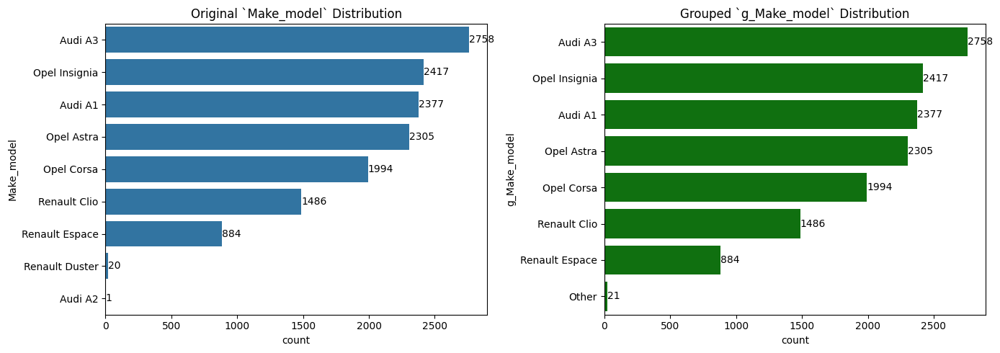

Grouping Low Frequency Categories 
 Processing Column: Body_type
Categorical Summary for Body_type 
                Count  Percentage (%)
Body_type                           
Sedans          7230          50.770
Station wagon   3405          23.910
Compact         2710          19.030
Van              735           5.160
Transporter       87           0.610
Off-Road          42           0.290
Coupe             25           0.180
Convertible        8           0.060


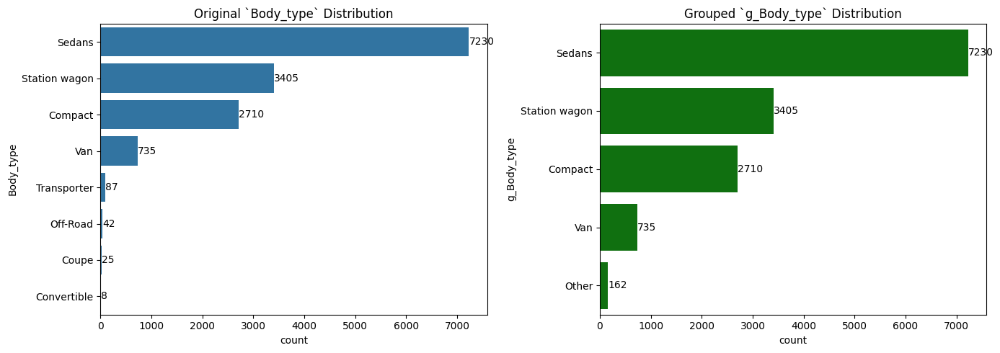

Grouping Low Frequency Categories 
 Processing Column: Vat
Categorical Summary for Vat 
                   Count  Percentage (%)
Vat                                    
VAT deductible    13426          94.270
Price negotiable    816           5.730


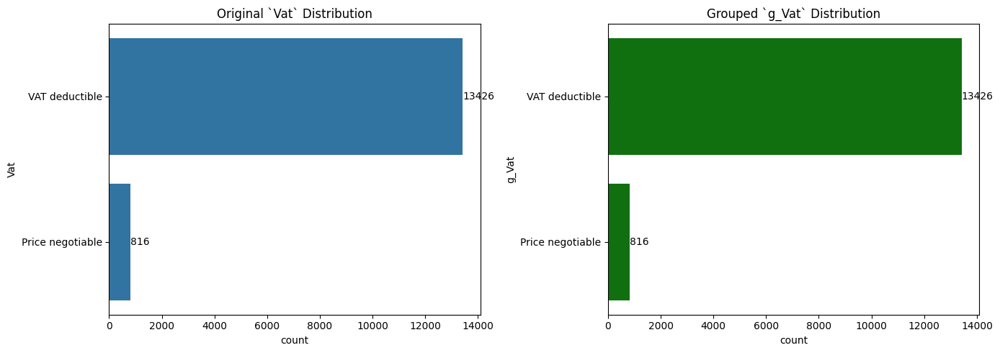

Grouping Low Frequency Categories 
 Processing Column: Fuel
Categorical Summary for Fuel 
           Count  Percentage (%)
Fuel                           
Benzine    7558          53.070
Diesel     6619          46.480
LPG/CNG      60           0.420
Electric      5           0.040


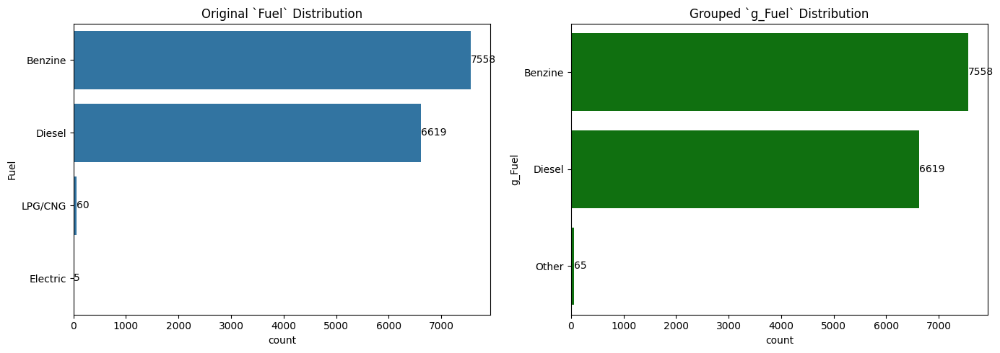

Grouping Low Frequency Categories 
 Processing Column: Gears
Categorical Summary for Gears 
        Count  Percentage (%)
Gears                       
6.000   7764          54.510
5.000   3771          26.480
7.000   2504          17.580
8.000    203           1.430


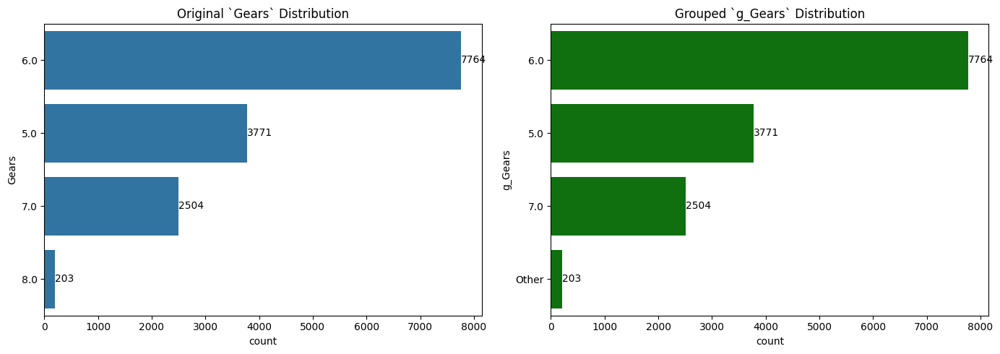

Grouping Low Frequency Categories 
 Processing Column: Previous_owners
Categorical Summary for Previous_owners 
                  Count  Percentage (%)
Previous_owners                       
1.000            12700          89.170
2.000             1014           7.120
0.000              497           3.490
3.000               29           0.200
4.000                2           0.010


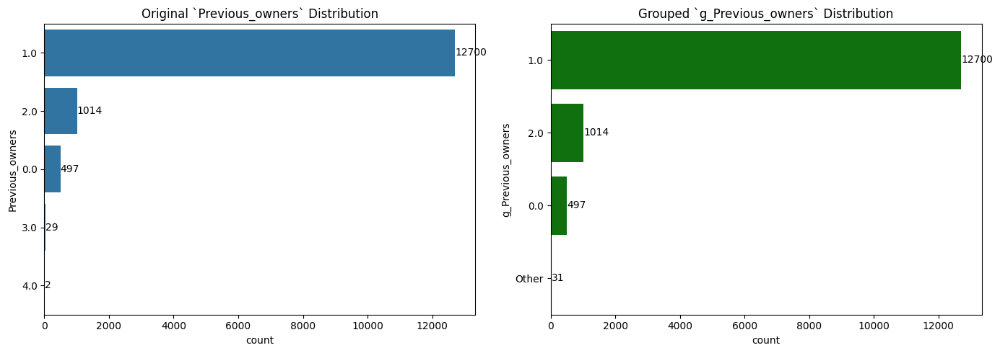

Grouping Low Frequency Categories 
 Processing Column: Inspection_new
Categorical Summary for Inspection_new 
                 Count  Percentage (%)
Inspection_new                       
0               10592          74.370
1                3650          25.630


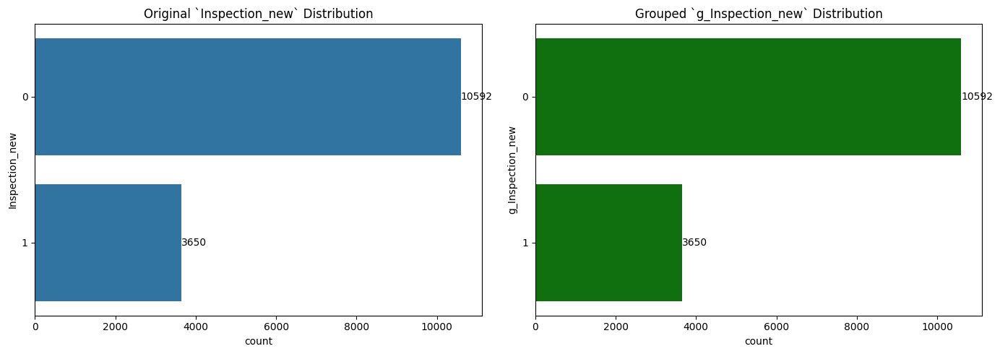

Grouping Low Frequency Categories 
 Processing Column: Paint_type
Categorical Summary for Paint_type 
              Count  Percentage (%)
Paint_type                        
Metallic     13682          96.070
Uni/basic      549           3.850
Perl effect     11           0.080


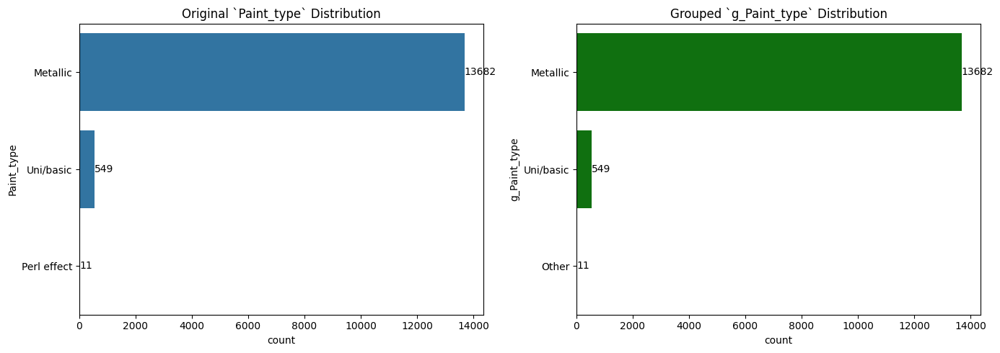

Grouping Low Frequency Categories 
 Processing Column: Upholstery_type
Categorical Summary for Upholstery_type 
                    Count  Percentage (%)
Upholstery_type                         
Cloth              10918          76.660
Part/Full Leather   3324          23.340


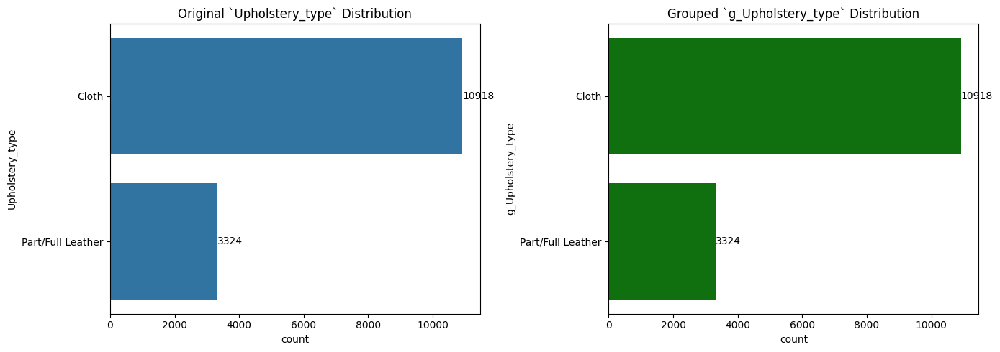

Grouping Low Frequency Categories 
 Processing Column: Gearing_type
Categorical Summary for Gearing_type 
                 Count  Percentage (%)
Gearing_type                         
Manual           7232          50.780
Automatic        6546          45.960
Semi-automatic    464           3.260


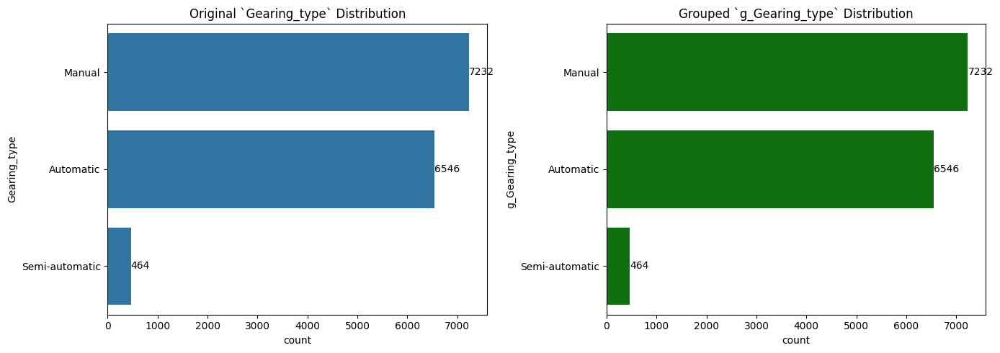

Grouping Low Frequency Categories 
 Processing Column: Drive_chain
Categorical Summary for Drive_chain 
              Count  Percentage (%)
Drive_chain                       
front        14067          98.770
4WD            171           1.200
rear             4           0.030


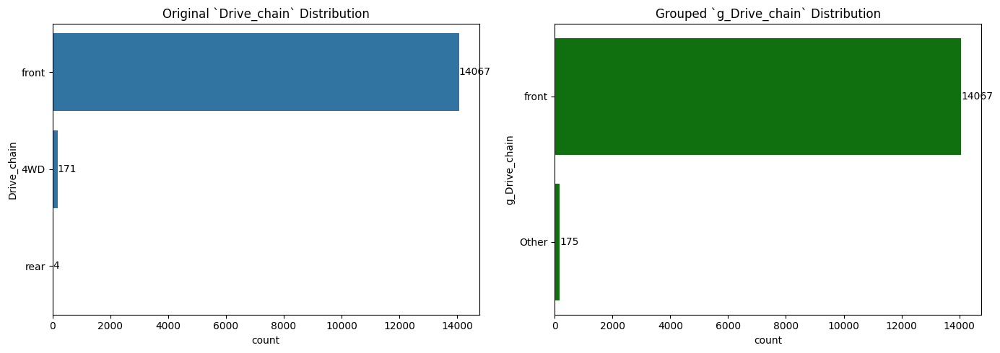

In [27]:
rare_cleanse =['Make_model',
                'Body_type',
                'Vat',
                'Fuel',
                'Gears',
                'Previous_owners',
                'Inspection_new',
                'Paint_type',
                'Upholstery_type',
                'Gearing_type',
                'Drive_chain',
                ]
for cols in  rare_cleanse:
    my_log("Grouping Low Frequency Categories", f'Processing Column: {cols}')
    summary = summarize_categorical(car_df[cols], name=cols)
    my_log(f"Categorical Summary for {cols}", summary)
    df_cleaned = group_and_plot_low_frequency(car_df, col=cols, threshold_pct=2) # 2% threshold

In [28]:
car_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14242 entries, 0 to 15912
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Price                14242 non-null  int64   
 1   Km                   14242 non-null  float64 
 2   Comfort_convenience  14242 non-null  category
 3   Entertainment_media  14242 non-null  category
 4   Extras               14242 non-null  category
 5   Safety_security      14242 non-null  category
 6   Age                  14242 non-null  float64 
 7   Hp_kw                14242 non-null  float64 
 8   Displacement_cc      14242 non-null  float64 
 9   Weight_kg            14242 non-null  float64 
 10  Cons_comb            14242 non-null  float64 
 11  g_Type               14242 non-null  category
 12  g_Make_model         14242 non-null  category
 13  g_Body_type          14242 non-null  category
 14  g_Vat                14242 non-null  category
 15  g_Fuel               142

In [29]:
# update categorical predictor list
categorical_predictor = car_df.select_dtypes(include=['category']).columns.tolist()
my_log("Updated Categorical Predictor", f'\nCategorical Predictor : {categorical_predictor}')

Updated Categorical Predictor 
 
Categorical Predictor : ['Comfort_convenience', 'Entertainment_media', 'Extras', 'Safety_security', 'g_Type', 'g_Make_model', 'g_Body_type', 'g_Vat', 'g_Fuel', 'g_Gears', 'g_Previous_owners', 'g_Inspection_new', 'g_Paint_type', 'g_Upholstery_type', 'g_Gearing_type', 'g_Drive_chain']


#### **2.1.5** <font color =red> [3 marks] </font>
Identify target variable and plot the frequency distributions. Apply necessary transformations.

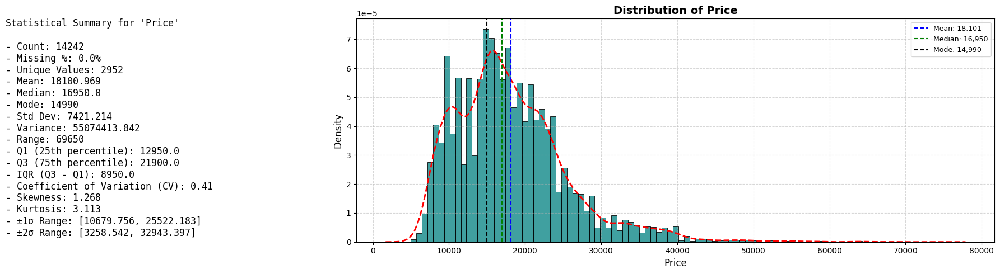

In [30]:
# Plot histograms for target feature
plot_distribution_summary(car_df['Price'], 'Price', hist_color='teal')


**The target variable seems to be skewed. Perform suitable transformation on the target.**

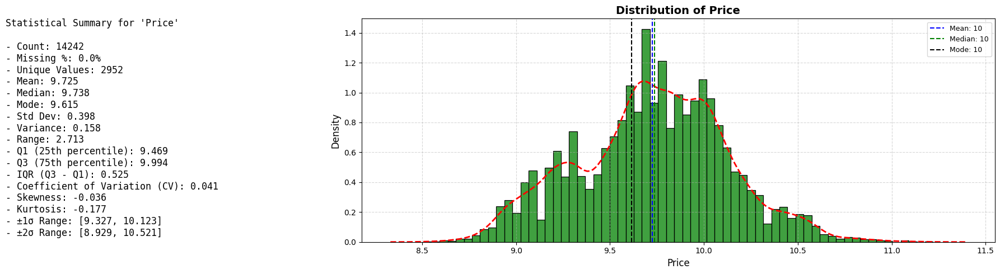

In [31]:
# Transform the target feature
plot_distribution_summary(np.log(car_df['Price']), 'Price', hist_color='green')


In [32]:
condition = np.log(car_df['Price']).skew() < car_df['Price'].skew()

my_log("Log Transformation Skew Check",
              f"Is log-transformed Price less skewed than original? → {condition}")

Log Transformation Skew Check 
 Is log-transformed Price less skewed than original? → True


### **2.2 Correlation analysis** <font color = red> [6 marks] </font>

#### **2.2.1** <font color =red> [3 marks] </font>
Plot the correlation map between features and target variable.

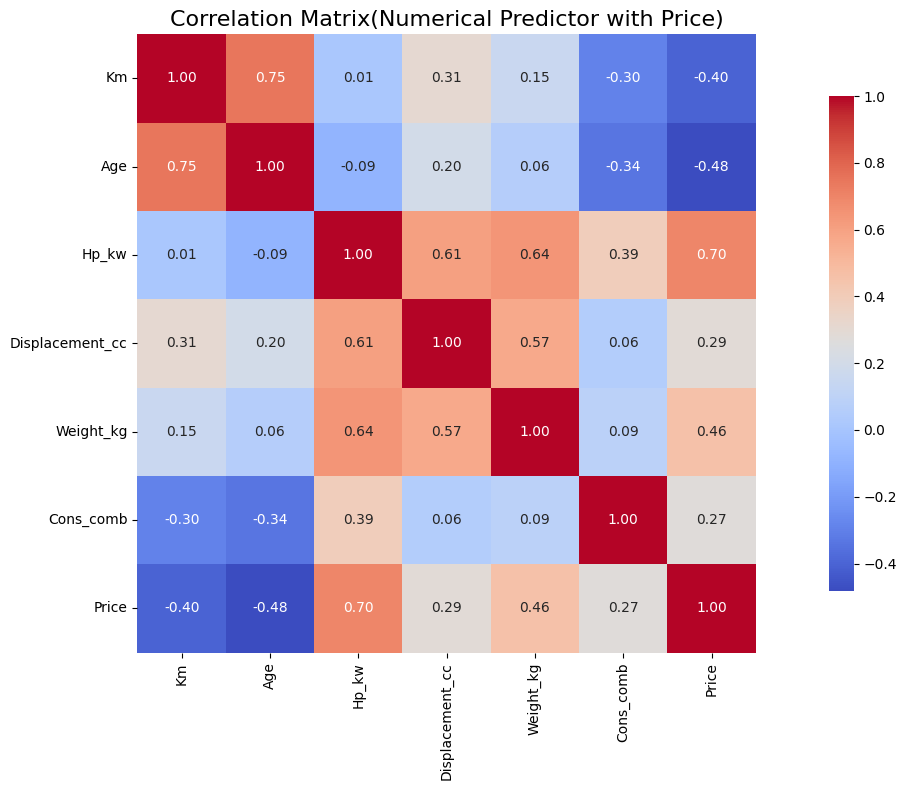

In [33]:
# Visualise correlation
corr_matrix = car_df[numerical_predictor.tolist() + ['Price']].corr()
plt.figure(figsize=(15, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix(Numerical Predictor with Price)', fontsize=16)
plt.tight_layout()
plt.show()


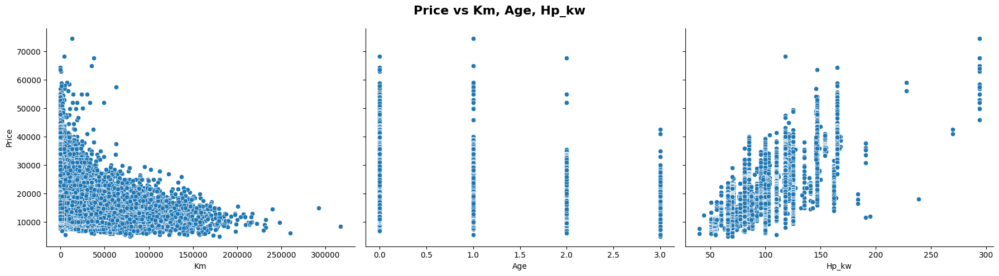

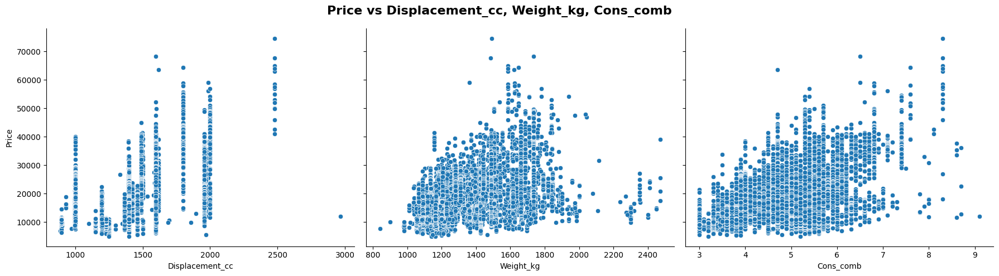

In [34]:
# Correlation by scatterplot Price vs numerical_predictor
for i in range(0, len(numerical_predictor), 3):
    cols_subset = numerical_predictor[i:i+3]

    sns.pairplot(
        data=car_df,
        x_vars=cols_subset,
        y_vars=['Price'],
        kind='scatter',
        height=5,
        aspect=1.2
    )
    plt.suptitle(f'Price vs {", ".join(cols_subset)}', fontsize=16, weight='bold')
    plt.tight_layout()
    plt.show()

In [35]:
# Check Multicolinarty between features

def color_custom(val):
    """
    Color codes correlation values based on strength and direction.
    """
    if val >= 0.9:
        color = 'blue'     # Perfect or very strong positive
    elif val >= 0.7:
        color = 'green'    # Strong positive
    elif val >= 0.3:
        color = 'darkgreen' # Moderate positive
    elif val > 0:
        color = 'gray'     # Weak positive
    elif val <= -0.9:
        color = 'purple'   # Perfect or very strong negative
    elif val <= -0.7:
        color = 'orange'   # Strong negative
    elif val <= -0.3:
        color = 'darkorange' # Moderate negative
    elif val < 0:
        color = 'lightgray' # Weak negative
    else:
        color = 'black'    # No correlation
    return f'color: {color}'

my_log("Correlation Matrix with Color Coding", "Correlation values color-coded based on strength and direction.")
corr_matrix.corr().style.applymap(color_custom)


Correlation Matrix with Color Coding 
 Correlation values color-coded based on strength and direction.


,Km,Age,Hp_kw,Displacement_cc,Weight_kg,Cons_comb,Price
Km,1.000000,0.960308,-0.716631,0.066854,-0.302978,-0.833612,-0.879723
Age,0.960308,1.000000,-0.778806,-0.025127,-0.376507,-0.827801,-0.913058
Hp_kw,-0.716631,-0.778806,1.000000,0.509695,0.736317,0.511308,0.911379
Displacement_cc,0.066854,-0.025127,0.509695,1.000000,0.662917,-0.216141,0.254768
Weight_kg,-0.302978,-0.376507,0.736317,0.662917,1.000000,0.022172,0.607775
Cons_comb,-0.833612,-0.827801,0.511308,-0.216141,0.022172,1.000000,0.573684
Price,-0.879723,-0.913058,0.911379,0.254768,0.607775,0.573684,1.000000


### **Correlation Color Legend**

| **Color**      | **Correlation Range** | **Interpretation**                    |
|----------------|------------------------|----------------------------------------|
| 🔵 Blue        | > 0.9                  | Perfect / Very Strong Positive         |
| 🟢 Green       | 0.7 – 0.9              | Strong Positive                        |
| 🟩 Dark Green  | 0.3 – 0.7              | Moderate Positive                      |
| ⚪ Gray        | 0 – 0.3                | Weak Positive                          |
| ⚫ Black       | 0                      | No Correlation                         |
| 🌫️ Light Gray | -0.3 – 0               | Weak Negative                          |
| 🟠 Dark Orange | -0.7 – -0.3            | Moderate Negative                      |
| 🟧 Orange      | -0.9 – -0.7            | Strong Negative                        |
| 🟣 Purple      | < -0.9                 | Perfect / Very Strong Negative

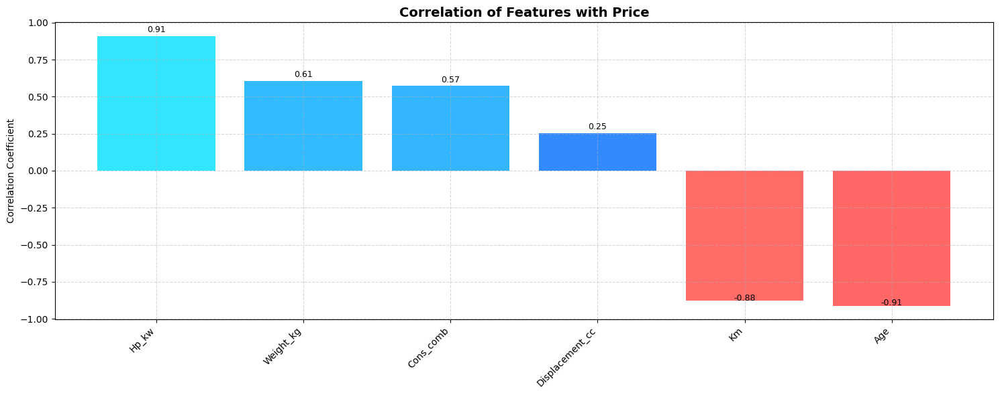

In [36]:
# Compute correlation with target
correlation_matrix = corr_matrix.corr()
price_corr = correlation_matrix['Price'].drop('Price').sort_values(ascending=False)

# Color mapping: blue for positive, red for negative
colors = []
for val in price_corr.values:
    if val >= 0:
        # Light blue to dark blue
        intensity = val / max(price_corr.values)
        colors.append((0.2, 0.4 + 0.5 * intensity, 1.0))  # RGB tuple
    else:
        # Dark red to light red
        intensity = abs(val) / abs(min(price_corr.values))
        colors.append((1.0, 0.4 + 0.5 * (1 - intensity), 0.4))  # RGB tuple

# Plot
plt.figure(figsize=(15, 6))
bars = plt.bar(price_corr.index, price_corr.values, color=colors)
plt.title('Correlation of Features with Price', fontsize=14, weight='bold')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45, ha='right')
plt.grid(True, linestyle='--', alpha=0.5)

# Annotate each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.01*np.sign(height),
             f'{height:.2f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


#### **2.2.2** <font color =red> [3 marks] </font>
Analyse correlation between categorical features and target variable.

In [37]:
# Remove 'g_' from grouping columns
car_df.rename(columns=lambda x: x[2:] if x.startswith('g_') else x, inplace=True)

# Verify the updated column names
my_log("Updated Column Names", f"\n{car_df.columns.tolist()}")
categorical_predictor= car_df.select_dtypes(include=['object']).columns.tolist()

Updated Column Names 
 
['Price', 'Km', 'Comfort_convenience', 'Entertainment_media', 'Extras', 'Safety_security', 'Age', 'Hp_kw', 'Displacement_cc', 'Weight_kg', 'Cons_comb', 'Type', 'Make_model', 'Body_type', 'Vat', 'Fuel', 'Gears', 'Previous_owners', 'Inspection_new', 'Paint_type', 'Upholstery_type', 'Gearing_type', 'Drive_chain']


In [38]:
def plot_multiple_categories_vs_target(df, cols, target_col='Price', top_n=20, palette='Set2', n_cols=4):
    """
    Plots subplots of average target values across multiple categorical columns with vertical bars.
    """
    def annotate_bars(ax):
        for container in ax.containers:
            ax.bar_label(container, label_type='edge', fontsize=9)

    n_rows = (len(cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for i, col in enumerate(cols):
        group_means = df.groupby(col)[target_col].mean().sort_values(ascending=False).head(top_n)
        ax = axes[i]
        sns.barplot(x=group_means.index, y=group_means.values, palette=palette, ax=ax)
        ax.set_title(f'Average {target_col} by `{col}`', fontsize=13, weight='bold')
        ax.set_xlabel(col)
        ax.set_ylabel(f'Average {target_col}')
        ax.grid(True, linestyle='--', alpha=0.4)
        annotate_bars(ax)
        ax.tick_params(axis='x', rotation=45)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


In [39]:
# Exlude less relevant categorical predictors
filter_categorical_predictor =['Make_model',
                'Body_type',
                'Vat',
                'Fuel',
                'Gears',
                'Previous_owners',
                'Inspection_new',
                'Paint_type',
                'Upholstery_type',
                'Gearing_type',
                'Drive_chain',
                ]

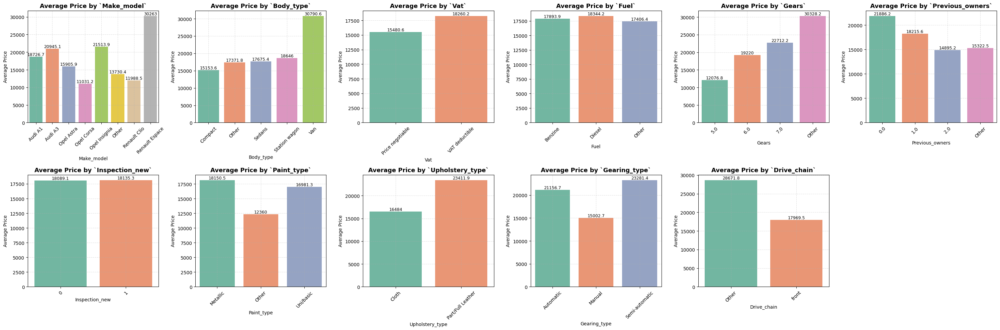

In [40]:
# Comparing average values of target for different categories

plot_multiple_categories_vs_target(car_df, filter_categorical_predictor, target_col='Price', top_n=10, palette='Set2', n_cols=6)

### **2.3 Outlier analysis** <font color = red> [5 marks] </font>

#### **2.3.1** <font color =red> [2 marks] </font>
Identify potential outliers in the data.

In [41]:
# Outliers present in each column
car_df[numerical_predictor].describe().T


,count,mean,std,min,25%,50%,75%,max
Km,14242.000,32582.110,36856.863,0.000,3898.000,21000.000,47000.000,317000.000
Age,14242.000,1.415,1.110,0.000,0.000,1.000,2.000,3.000
Hp_kw,14242.000,88.713,26.548,40.000,66.000,85.000,103.000,294.000
Displacement_cc,14242.000,1432.890,277.507,890.000,1229.000,1461.000,1598.000,2967.000
Weight_kg,14242.000,1342.399,201.247,840.000,1165.000,1320.000,1487.000,2471.000
Cons_comb,14242.000,4.825,0.862,3.000,4.100,4.800,5.400,9.100


In [42]:
categorical_predictor= car_df.select_dtypes(include=['category']).columns.tolist()
categorical_predictor

['Comfort_convenience',
 'Entertainment_media',
 'Extras',
 'Safety_security',
 'Type',
 'Make_model',
 'Body_type',
 'Vat',
 'Fuel',
 'Gears',
 'Previous_owners',
 'Inspection_new',
 'Paint_type',
 'Upholstery_type',
 'Gearing_type',
 'Drive_chain']

In [43]:
car_df[categorical_predictor].describe().T

,count,unique,top,freq
Comfort_convenience,14242,6196,"Air conditioning,Electrical side mirrors,Hill ...",312
Entertainment_media,14242,346,"Bluetooth,Hands-free equipment,On-board comput...",1562
Extras,14242,659,Alloy wheels,5010
Safety_security,14242,4442,"ABS,Central door lock,Daytime running lights,D...",635
Type,14242,3,Used,10172
Make_model,14242,8,Audi A3,2758
Body_type,14242,5,Sedans,7230
Vat,14242,2,VAT deductible,13426
Fuel,14242,3,Benzine,7558
Gears,14242.000,4.000,6.000,7764.000


#### **2.3.2** <font color =red> [3 marks] </font>
Handle the outliers suitably.

In [44]:
def plot_box_violin(df, columns, figsize=(20, 6), box_color='skyblue', violin_color='lightgreen'):
    '''
        Plots boxplots and violinplots for a list of numerical columns in a 2-row subplot grid.

    '''
    fig, axes = plt.subplots(2, len(columns), figsize=figsize)

    for i, col in enumerate(columns):
        sns.boxplot(y=df[col], ax=axes[0, i], color=box_color)
        axes[0, i].set_title(f'Boxplot: {col}')

        sns.violinplot(y=df[col], ax=axes[1, i], color=violin_color)
        axes[1, i].set_title(f'Violinplot: {col}')

    plt.tight_layout()
    plt.show()

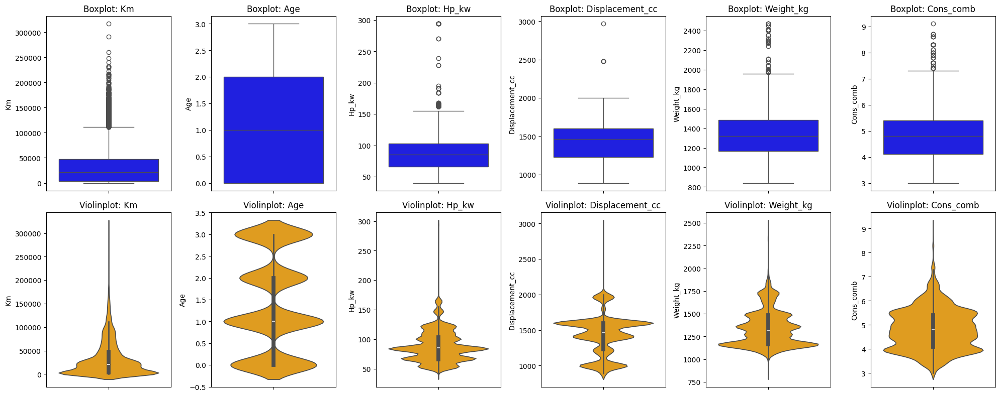

In [45]:
# Handle outliers
plot_box_violin(car_df, numerical_predictor.tolist(), figsize=(20, 8), box_color='blue', violin_color='orange')

In [46]:
# Perform IQR based outlier analysis
def iqr_outlier_analysis(df, features):
    """
    Perform IQR-based outlier analysis for the given features in the dataframe.
    """
    summary = []

    for feature in features:
        q1 = df[feature].quantile(0.25)
        q3 = df[feature].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]
        outlier_count = len(outliers)
        outlier_percentage = (outlier_count / len(df)) * 100

        summary.append({
            'Feature': feature,
            'Outlier Count': outlier_count,
            'Outlier Percentage (%)': round(outlier_percentage, 2),
            'Lower Bound': lower_bound,
            'Upper Bound': upper_bound
        })

    summary_df = pd.DataFrame(summary)
    summary_df.sort_values(by='Outlier Count', ascending=False, inplace=True)
    return summary_df



In [47]:
# Perform IQR-based outlier analysis
outlier_summary = iqr_outlier_analysis(car_df, numerical_predictor.tolist())
outlier_summary

,Feature,Outlier Count,Outlier Percentage (%),Lower Bound,Upper Bound
0,Km,657,4.610,-60755.000,111653.000
2,Hp_kw,298,2.090,10.500,158.500
5,Cons_comb,111,0.780,2.150,7.350
4,Weight_kg,73,0.510,682.000,1970.000
3,Displacement_cc,21,0.150,675.500,2151.500
1,Age,0,0.000,-3.000,5.000


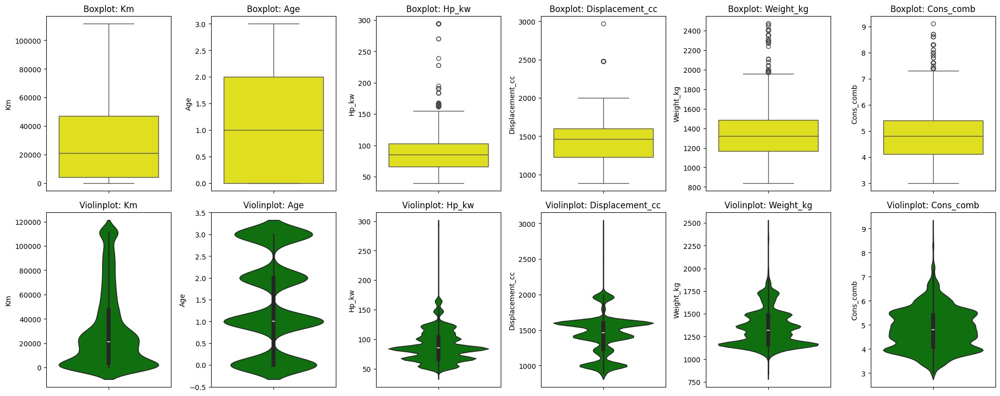

In [48]:
# Clip 'KM' to handle extremes
car_df['Km'] = car_df['Km'].clip(lower=-60755, upper=111653)
plot_box_violin(car_df, numerical_predictor.tolist(), figsize=(20, 8), box_color='yellow', violin_color='green')

### **2.4 Feature Engineering** <font color = red> [11 marks] </font>

#### **2.4.1**
Fix any redundant columns and create new ones if needed.

In [49]:
# Fix/create columns as needed
car_df_processed = car_df.copy()
my_log("Final Processed DataFrame", f"Shape of final processed DataFrame: {car_df_processed.shape}")
my_log("Starting Feature Enginering", "Creating dummy variables for categorical features and scaling numerical features.")


Final Processed DataFrame 
 Shape of final processed DataFrame: (14242, 23)
Starting Feature Enginering 
 Creating dummy variables for categorical features and scaling numerical features.


#### **2.4.2** <font color =red> [4 marks] </font>
Analysis and feature engineering on `['Comfort_Convenience', 'Entertainment_Media', 'Extras', 'Safety_Security']`.

In [50]:
multilabel_cols=['Comfort_convenience', 'Entertainment_media', 'Extras', 'Safety_security']
car_df_processed[multilabel_cols].head(5)

,Comfort_convenience,Entertainment_media,Extras,Safety_security
0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D..."
1,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r..."
2,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D..."
3,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote..."
4,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect..."


These columns contains lists of features present. Decide on how to include these features in the predictors.

In [51]:
def expand_multilabel_features(df, multilabel_cols, common_thresh=0.95, rare_thresh=0.01, verbose=True):
    """
    Expands multi-label string columns into binary features and removes overly common or rare ones.
    """
    df = df.copy()
    feature_counts = {}

    for col in multilabel_cols:
        for index, row in df.iterrows():
            if isinstance(row[col], str):
                features = row[col].split(',')
                for feature in features:
                    feature_name = f"{col}_{feature.strip().replace(' ', '_')}"
                    if feature_name not in df.columns:
                        df[feature_name] = 0
                        feature_counts[feature_name] = 0
                    df.at[index, feature_name] = 1
                    feature_counts[feature_name] += 1

    # Convert counts to percentages
    total_rows = len(df)
    feature_freq = {k: v / total_rows for k, v in feature_counts.items()}

    # Identify features to drop
    drop_features = [f for f, freq in feature_freq.items() if freq > common_thresh or freq < rare_thresh]

    if verbose:
        print(f"🔍 Dropping {len(drop_features)} features due to frequency thresholds:")
        for f in drop_features:
            print(f" - {f}: {feature_freq[f]:.2%}")

    # Drop identified features
    df.drop(columns=drop_features, inplace=True)

    return df


In [52]:
# Check unique values in each feature spec column
my_log("Expanding Multi-label Features", "Expanding multi-label features into binary columns and removing overly common/rare ones.")
car_df_processed = expand_multilabel_features(
    car_df_processed,
    multilabel_cols=['Comfort_convenience', 'Entertainment_media', 'Extras', 'Safety_security'],
    common_thresh=0.95,
    rare_thresh=0.01
)
my_log("DataFrame after Expanding Multi-label Features", f"Shape after expanding multi-label features: {car_df_processed.shape}")


Expanding Multi-label Features 
 Expanding multi-label features into binary columns and removing overly common/rare ones.
🔍 Dropping 12 features due to frequency thresholds:
 - Comfort_convenience_Air_conditioning: 95.45%
 - Comfort_convenience_Air_suspension: 0.46%
 - Comfort_convenience_Wind_deflector: 0.29%
 - Comfort_convenience_Leather_seats: 0.34%
 - Comfort_convenience_Windshield: 0.08%
 - Comfort_convenience_Electric_Starter: 0.01%
 - Entertainment_media_Television: 0.27%
 - Extras_Handicapped_enabled: 0.37%
 - Extras_Tuned_car: 0.09%
 - Extras_Sliding_door: 0.02%
 - Extras_Right_hand_drive: 0.02%
 - Safety_security_Night_view_assist: 0.53%
DataFrame after Expanding Multi-label Features 
 Shape after expanding multi-label features: (14242, 105)


Out of these features, we will check the ones which are present in most of the cars or are absent from most of the cars. These kinds of features can be removed as they just increase the dimensionality without explaining the variance.

In [53]:
# Drop features from df
car_df_processed.drop(columns=['Comfort_convenience', 'Entertainment_media', 'Extras', 'Safety_security'], inplace=True)
my_log("Dropped Multi-label Original Columns", "Dropped original multi-label columns after expansion.")
car_df_processed.head(2)


Dropped Multi-label Original Columns 
 Dropped original multi-label columns after expansion.


,Price,Km,Age,Hp_kw,Displacement_cc,Weight_kg,Cons_comb,Type,Make_model,Body_type,Vat,Fuel,Gears,Previous_owners,Inspection_new,Paint_type,Upholstery_type,Gearing_type,Drive_chain,Comfort_convenience_Armrest,Comfort_convenience_Automatic_climate_control,Comfort_convenience_Cruise_control,Comfort_convenience_Electrical_side_mirrors,Comfort_convenience_Hill_Holder,Comfort_convenience_Leather_steering_wheel,Comfort_convenience_Light_sensor,Comfort_convenience_Multi-function_steering_wheel,Comfort_convenience_Navigation_system,Comfort_convenience_Park_Distance_Control,Comfort_convenience_Parking_assist_system_sensors_rear,Comfort_convenience_Power_windows,Comfort_convenience_Rain_sensor,Comfort_convenience_Seat_heating,Comfort_convenience_Start-stop_system,Comfort_convenience_Lumbar_support,Comfort_convenience_Tinted_windows,Comfort_convenience_Parking_assist_system_sensors_front,Comfort_convenience_Auxiliary_heating,Comfort_convenience_Heads-up_display,Comfort_convenience_Split_rear_seats,Comfort_convenience_Keyless_central_door_lock,Comfort_convenience_Electrically_heated_windshield,Comfort_convenience_Seat_ventilation,Comfort_convenience_Sunroof,Comfort_convenience_Panorama_roof,Comfort_convenience_Parking_assist_system_camera,Comfort_convenience_Electrically_adjustable_seats,Comfort_convenience_Parking_assist_system_self-steering,Comfort_convenience_Electric_tailgate,Comfort_convenience_Heated_steering_wheel,Comfort_convenience_Massage_seats,Entertainment_media_Bluetooth,Entertainment_media_Hands-free_equipment,Entertainment_media_On-board_computer,Entertainment_media_Radio,Entertainment_media_Sound_system,Entertainment_media_MP3,Entertainment_media_CD_player,Entertainment_media_USB,Entertainment_media_Digital_radio,Extras_Alloy_wheels,Extras_Catalytic_Converter,Extras_Voice_Control,Extras_Sport_seats,Extras_Sport_suspension,Extras_Sport_package,Extras_Shift_paddles,Extras_Winter_tyres,Extras_Touch_screen,Extras_Trailer_hitch,Extras_Cab_or_rented_Car,Extras_Roof_rack,Extras_Ski_bag,Safety_security_ABS,Safety_security_Central_door_lock,Safety_security_Daytime_running_lights,Safety_security_Driver-side_airbag,Safety_security_Electronic_stability_control,Safety_security_Fog_lights,Safety_security_Immobilizer,Safety_security_Isofix,Safety_security_Passenger-side_airbag,Safety_security_Power_steering,Safety_security_Side_airbag,Safety_security_Tire_pressure_monitoring_system,Safety_security_Traction_control,Safety_security_Xenon_headlights,Safety_security_Central_door_lock_with_remote_control,Safety_security_Head_airbag,Safety_security_Alarm_system,Safety_security_Driver_drowsiness_detection,Safety_security_Emergency_system,Safety_security_LED_Headlights,Safety_security_Adaptive_headlights,Safety_security_LED_Daytime_Running_Lights,Safety_security_Rear_airbag,Safety_security_Emergency_brake_assistant,Safety_security_Adaptive_Cruise_Control,Safety_security_Traffic_sign_recognition,Safety_security_Lane_departure_warning_system,Safety_security_Blind_spot_monitor
0,15770,56013.000,3.000,66.000,1422.000,1220.000,3.800,Used,Audi A1,Sedans,VAT deductible,Diesel,7.000,2.000,1,Metallic,Cloth,Automatic,front,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,14500,80000.000,2.000,141.000,1798.000,1255.000,5.600,Used,Audi A1,Sedans,Price negotiable,Benzine,7.000,1.000,0,Metallic,Cloth,Automatic,front,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0


#### **2.4.3** <font color =red> [3 marks] </font>
Perform feature encoding.

In [54]:
categorical_predictor = car_df_processed.select_dtypes(include=['category']).columns.tolist()
my_log("Final Categorical Predictor", f'\nCategorical Predictor : {categorical_predictor}')

Final Categorical Predictor 
 
Categorical Predictor : ['Type', 'Make_model', 'Body_type', 'Vat', 'Fuel', 'Gears', 'Previous_owners', 'Inspection_new', 'Paint_type', 'Upholstery_type', 'Gearing_type', 'Drive_chain']


In [55]:
# Encode features
def encode_categorical_features(df, categorical_cols, drop_first=True):
    """
    One-hot encodes categorical columns, logs shape changes, and optimizes binary columns.
    """
    df = df.copy()

    for col in categorical_cols:
        if col in df.columns:
            unique_count = df[col].nunique()
            print(f"  {col}: {unique_count} categories")

    # Logging (optional: replace with your logging function)
    my_log("One-Hot Encoding Categorical Features", "Applying One-Hot Encoding to categorical features.")
    my_log("DataFrame before One-Hot Encoding", f"Shape before one-hot encoding: {df.shape}")

    # One-hot encode
    df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=drop_first)

    # Convert boolean columns to int
    binary_cols = df_encoded.columns[df_encoded.dtypes == 'bool']
    df_encoded[binary_cols] = df_encoded[binary_cols].astype(int)

    # Optimize binary integer columns
    binary_int_cols = [col for col in df_encoded.columns if set(df_encoded[col].unique()).issubset({0, 1})]
    df_encoded = df_encoded.astype({col: 'int8' for col in binary_int_cols})

    return df_encoded



In [56]:
car_df_ecoded = encode_categorical_features(car_df_processed, categorical_predictor, drop_first=True)
my_log("Final Encoded DataFrame", f"Shape of final encoded DataFrame: {car_df_ecoded.shape}")
car_df_ecoded.head(2)

  Type: 3 categories
  Make_model: 8 categories
  Body_type: 5 categories
  Vat: 2 categories
  Fuel: 3 categories
  Gears: 4 categories
  Previous_owners: 4 categories
  Inspection_new: 2 categories
  Paint_type: 3 categories
  Upholstery_type: 2 categories
  Gearing_type: 3 categories
  Drive_chain: 2 categories
One-Hot Encoding Categorical Features 
 Applying One-Hot Encoding to categorical features.
DataFrame before One-Hot Encoding 
 Shape before one-hot encoding: (14242, 101)
Final Encoded DataFrame 
 Shape of final encoded DataFrame: (14242, 118)


,Price,Km,Age,Hp_kw,Displacement_cc,Weight_kg,Cons_comb,Comfort_convenience_Armrest,Comfort_convenience_Automatic_climate_control,Comfort_convenience_Cruise_control,Comfort_convenience_Electrical_side_mirrors,Comfort_convenience_Hill_Holder,Comfort_convenience_Leather_steering_wheel,Comfort_convenience_Light_sensor,Comfort_convenience_Multi-function_steering_wheel,Comfort_convenience_Navigation_system,Comfort_convenience_Park_Distance_Control,Comfort_convenience_Parking_assist_system_sensors_rear,Comfort_convenience_Power_windows,Comfort_convenience_Rain_sensor,Comfort_convenience_Seat_heating,Comfort_convenience_Start-stop_system,Comfort_convenience_Lumbar_support,Comfort_convenience_Tinted_windows,Comfort_convenience_Parking_assist_system_sensors_front,Comfort_convenience_Auxiliary_heating,Comfort_convenience_Heads-up_display,Comfort_convenience_Split_rear_seats,Comfort_convenience_Keyless_central_door_lock,Comfort_convenience_Electrically_heated_windshield,Comfort_convenience_Seat_ventilation,Comfort_convenience_Sunroof,Comfort_convenience_Panorama_roof,Comfort_convenience_Parking_assist_system_camera,Comfort_convenience_Electrically_adjustable_seats,Comfort_convenience_Parking_assist_system_self-steering,Comfort_convenience_Electric_tailgate,Comfort_convenience_Heated_steering_wheel,Comfort_convenience_Massage_seats,Entertainment_media_Bluetooth,Entertainment_media_Hands-free_equipment,Entertainment_media_On-board_computer,Entertainment_media_Radio,Entertainment_media_Sound_system,Entertainment_media_MP3,Entertainment_media_CD_player,Entertainment_media_USB,Entertainment_media_Digital_radio,Extras_Alloy_wheels,Extras_Catalytic_Converter,Extras_Voice_Control,Extras_Sport_seats,Extras_Sport_suspension,Extras_Sport_package,Extras_Shift_paddles,Extras_Winter_tyres,Extras_Touch_screen,Extras_Trailer_hitch,Extras_Cab_or_rented_Car,Extras_Roof_rack,Extras_Ski_bag,Safety_security_ABS,Safety_security_Central_door_lock,Safety_security_Daytime_running_lights,Safety_security_Driver-side_airbag,Safety_security_Electronic_stability_control,Safety_security_Fog_lights,Safety_security_Immobilizer,Safety_security_Isofix,Safety_security_Passenger-side_airbag,Safety_security_Power_steering,Safety_security_Side_airbag,Safety_security_Tire_pressure_monitoring_system,Safety_security_Traction_control,Safety_security_Xenon_headlights,Safety_security_Central_door_lock_with_remote_control,Safety_security_Head_airbag,Safety_security_Alarm_system,Safety_security_Driver_drowsiness_detection,Safety_security_Emergency_system,Safety_security_LED_Headlights,Safety_security_Adaptive_headlights,Safety_security_LED_Daytime_Running_Lights,Safety_security_Rear_airbag,Safety_security_Emergency_brake_assistant,Safety_security_Adaptive_Cruise_Control,Safety_security_Traffic_sign_recognition,Safety_security_Lane_departure_warning_system,Safety_security_Blind_spot_monitor,Type_New,Type_Used,Make_model_Audi A3,Make_model_Opel Astra,Make_model_Opel Corsa,Make_model_Opel Insignia,Make_model_Other,Make_model_Renault Clio,Make_model_Renault Espace,Body_type_Other,Body_type_Sedans,Body_type_Station wagon,Body_type_Van,Vat_VAT deductible,Fuel_Diesel,Fuel_Other,Gears_6.0,Gears_7.0,Gears_Other,Previous_owners_1.0,Previous_owners_2.0,Previous_owners_Other,Inspection_new_1,Paint_type_Other,Paint_type_Uni/basic,Upholstery_type_Part/Full Leather,Gearing_type_Manual,Gearing_type_Semi-automatic,Drive_chain_front
0,15770,56013.000,3.000,66.000,1422.000,1220.000,3.800,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,1,0,0,0,0,0,1
1,14500,80000.000,2.000,141.000,1798.000,1255.000,5.600,0,1,0,0,1,1,0,0,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1


In [57]:
my_log("Final Encoded DataFrame", f"Shape of final encoded DataFrame: {car_df_ecoded.shape}")

Final Encoded DataFrame 
 Shape of final encoded DataFrame: (14242, 118)


In [58]:
#Reset after cleanse complete
car_df_ecoded.reset_index(drop=True, inplace=True)

#### **2.4.4** <font color =red> [2 marks] </font>
Split the data into training and testing sets.

In [59]:
# Split data
X = car_df_ecoded.drop(columns=['Price'])
y = np.log(car_df_ecoded['Price'])  # Log-transform target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
my_log("Train-Test Split", f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {y_train.shape}, y_test: {y_test.shape}")
# Write to CSV for diffrent model training
X_train.to_csv('/content/sample_data/Car_Price/X_train.csv', index=False)
X_test.to_csv('/content/sample_data/Car_Price/X_test.csv', index=False)
y_train.to_csv('/content/sample_data/Car_Price/y_train.csv', index=False)
y_test.to_csv('/content/sample_data/Car_Price.y_test.csv', index=False)

Train-Test Split 
 X_train: (11393, 117), X_test: (2849, 117), y_train: (11393,), y_test: (2849,)


#### **2.4.5** <font color =red> [2 marks] </font>
Scale the features.

In [60]:
# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[numerical_predictor])
X_test_scaled = scaler.transform(X_test[numerical_predictor])
my_log("Feature Scaling", "Applied StandardScaler to numerical features.")
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=numerical_predictor, index=X_train.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=numerical_predictor, index=X_test.index)
# Replace original numerical columns with scaled versions
X_train.update(X_train_scaled_df)
X_test.update(X_test_scaled_df)
my_log("Scaled Feature Update", "Replaced original numerical features with scaled versions in training and test sets.")
X_train.to_csv('/content/sample_data/Car_Price/X_train_processed.csv', index=False)
X_test.to_csv('/content/sample_data/Car_Price/X_test_processed.csv', index=False)
y_train.to_csv('/content/sample_data/Car_Price/y_train_processed.csv', index=False)
y_test.to_csv('/content/sample_data/Car_Price/y_test_processed.csv', index=False)


Feature Scaling 
 Applied StandardScaler to numerical features.
Scaled Feature Update 
 Replaced original numerical features with scaled versions in training and test sets.


## **3 Linear Regression Models** <font color =red> [35 marks] </font>


### **3.1 Baseline Linear Regression Model** <font color =red> [10 marks] </font>

#### **3.1.1** <font color =red> [5 marks] </font>
Build and fit a basic linear regression model. Perform evaluation using suitable metrics.

In [61]:
def store_evaluation_metrics_pair(model_name, y_train, y_pred_train, X_train,
                                  y_test, y_pred_test, X_test):
    """
    Stores train and test evaluation metrics for a model into an internal DataFrame.
    """
    if not hasattr(store_evaluation_metrics_pair, "results_df"):
        store_evaluation_metrics_pair.results_df = pd.DataFrame(columns=[
            'Model', 'R2', 'MAE', 'MSE', 'RMSE', 'Adjusted R2'
        ])

    def compute_metrics(label, y_true, y_pred, X):
        r2 = r2_score(y_true, y_pred)
        mae = mean_absolute_error(y_true, y_pred)
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        adjusted_r2 = 1 - ((1 - r2) * (X.shape[0] - 1) / (X.shape[0] - X.shape[1] - 1))
        return {
            'Model': label,
            'R2': r2,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'Adjusted R2': adjusted_r2
        }

    train_metrics = compute_metrics(f"{model_name}_train", y_train, y_pred_train, X_train)
    test_metrics  = compute_metrics(f"{model_name}_test",  y_test,  y_pred_test,  X_test)

    store_evaluation_metrics_pair.results_df = pd.concat([
        store_evaluation_metrics_pair.results_df,
        pd.DataFrame([train_metrics, test_metrics])
    ], ignore_index=True)

    return store_evaluation_metrics_pair.results_df


In [62]:
def plot_residuals_from_preds(y_true, y_pred, figsize=(8, 5), title="Residuals vs Predicted Values"):
    '''
    Plot residuals from predictions.
    '''

    y_true = y_true.ravel() if hasattr(y_true, 'ravel') else y_true
    y_pred = y_pred.ravel() if hasattr(y_pred, 'ravel') else y_pred

    # Compute residuals
    residuals = y_true - y_pred
    residual_df = pd.DataFrame({
        "Predicted": y_pred,
        "Residuals": residuals
    })

    # Plot
    plt.figure(figsize=figsize)
    sns.scatterplot(
        x=residual_df["Predicted"],
        y=residual_df["Residuals"],
        alpha=0.6,
        edgecolor='w',
        linewidth=0.5,
        color="blue"
    )
    plt.axhline(y=0, color='red', linestyle='--', linewidth=1.2)
    plt.title(title, fontsize=14, weight='bold')
    plt.xlabel("Predicted Values", fontsize=12)
    plt.ylabel("Residuals", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()


In [63]:
def store_model_results(model_name, model, feature_names=None):
    """
    Stores intercept and coefficients of a model into internal DataFrames.

    """
    # Initialize internal DataFrames on first call
    if not hasattr(store_model_results, "intercept_df"):
        store_model_results.intercept_df = pd.DataFrame(columns=['Model', 'Intercept'])
    if not hasattr(store_model_results, "coef_df"):
        store_model_results.coef_df = pd.DataFrame(columns=['Feature'])

    try:
        # intercept and coefficients
        intercept = model.intercept_
        coefficients = model.coef_.ravel() if hasattr(model.coef_, 'ravel') else model.coef_

        # feature names
        if feature_names is None:
            feature_names = [f'Feature_{i}' for i in range(len(coefficients))]

        # Append intercept
        new_intercept = pd.DataFrame({'Model': [model_name], 'Intercept': [intercept]})
        store_model_results.intercept_df = pd.concat([store_model_results.intercept_df, new_intercept], ignore_index=True)

        # Append coefficients
        coef_col_name = f"{model_name}_Coefficient"
        new_coef = pd.DataFrame({'Feature': feature_names, coef_col_name: coefficients})
        store_model_results.coef_df = pd.merge(store_model_results.coef_df, new_coef, on='Feature', how='outer')

    except Exception as e:
        print(f"Error storing results for {model_name}: {e}")

    return store_model_results.intercept_df, store_model_results.coef_df


In [64]:
X_train_LR = pd.read_csv('/content/sample_data/Car_Price/X_train_processed.csv')
X_test_LR = pd.read_csv('/content/sample_data/Car_Price/X_test_processed.csv')
y_train_LR = pd.read_csv('/content/sample_data/Car_Price/y_train_processed.csv')
y_test_LR = pd.read_csv('/content/sample_data/Car_Price/y_test_processed.csv')

In [65]:
# Initialise and train model
LR_Base_model = LinearRegression()
LR_Base_model.fit(X_train_LR, y_train_LR)

LinearRegression()

In [66]:
#Intercept and Coefficent
intercept_df,coef_df= store_model_results('Linear_Regression_Base', LR_Base_model, feature_names=X_train.columns.tolist())
intercept_df

,Model,Intercept
0,Linear_Regression_Base,[9.868939038159025]


In [67]:
coef_df.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116
Feature,Age,Body_type_Other,Body_type_Sedans,Body_type_Station wagon,Body_type_Van,Comfort_convenience_Armrest,Comfort_convenience_Automatic_climate_control,Comfort_convenience_Auxiliary_heating,Comfort_convenience_Cruise_control,Comfort_convenience_Electric_tailgate,Comfort_convenience_Electrical_side_mirrors,Comfort_convenience_Electrically_adjustable_seats,Comfort_convenience_Electrically_heated_windsh...,Comfort_convenience_Heads-up_display,Comfort_convenience_Heated_steering_wheel,Comfort_convenience_Hill_Holder,Comfort_convenience_Keyless_central_door_lock,Comfort_convenience_Leather_steering_wheel,Comfort_convenience_Light_sensor,Comfort_convenience_Lumbar_support,Comfort_convenience_Massage_seats,Comfort_convenience_Multi-function_steering_wheel,Comfort_convenience_Navigation_system,Comfort_convenience_Panorama_roof,Comfort_convenience_Park_Distance_Control,Comfort_convenience_Parking_assist_system_camera,Comfort_convenience_Parking_assist_system_self...,Comfort_convenience_Parking_assist_system_sens...,Comfort_convenience_Parking_assist_system_sens...,Comfort_convenience_Power_windows,Comfort_convenience_Rain_sensor,Comfort_convenience_Seat_heating,Comfort_convenience_Seat_ventilation,Comfort_convenience_Split_rear_seats,Comfort_convenience_Start-stop_system,Comfort_convenience_Sunroof,Comfort_convenience_Tinted_windows,Cons_comb,Displacement_cc,Drive_chain_front,Entertainment_media_Bluetooth,Entertainment_media_CD_player,Entertainment_media_Digital_radio,Entertainment_media_Hands-free_equipment,Entertainment_media_MP3,Entertainment_media_On-board_computer,Entertainment_media_Radio,Entertainment_media_Sound_system,Entertainment_media_USB,Extras_Alloy_wheels,Extras_Cab_or_rented_Car,Extras_Catalytic_Converter,Extras_Roof_rack,Extras_Shift_paddles,Extras_Ski_bag,Extras_Sport_package,Extras_Sport_seats,Extras_Sport_suspension,Extras_Touch_screen,Extras_Trailer_hitch,Extras_Voice_Control,Extras_Winter_tyres,Fuel_Diesel,Fuel_Other,Gearing_type_Manual,Gearing_type_Semi-automatic,Gears_6.0,Gears_7.0,Gears_Other,Hp_kw,Inspection_new_1,Km,Make_model_Audi A3,Make_model_Opel Astra,Make_model_Opel Corsa,Make_model_Opel Insignia,Make_model_Other,Make_model_Renault Clio,Make_model_Renault Espace,Paint_type_Other,Paint_type_Uni/basic,Previous_owners_1.0,Previous_owners_2.0,Previous_owners_Other,Safety_security_ABS,Safety_security_Adaptive_Cruise_Control,Safety_security_Adaptive_headlights,Safety_security_Alarm_system,Safety_security_Blind_spot_monitor,Safety_security_Central_door_lock,Safety_security_Central_door_lock_with_remote_...,Safety_security_Daytime_running_lights,Safety_security_Driver-side_airbag,Safety_security_Driver_drowsiness_detection,Safety_security_Electronic_stability_control,Safety_security_Emergency_brake_assistant,Safety_security_Emergency_system,Safety_security_Fog_lights,Safety_security_Head_airbag,Safety_security_Immobilizer,Safety_security_Isofix,Safety_security_LED_Daytime_Running_Lights,Safety_security_LED_Headlights,Safety_security_Lane_departure_warning_system,Safety_security_Passenger-side_airbag,Safety_security_Power_steering,Safety_security_Rear_airbag,Safety_security_Side_airbag,Safety_security_Tire_pressure_monitoring_system,Safety_security_Traction_control,Safety_security_Traffic_sign_recognition,Safety_security_Xenon_headlights,Type_New,Type_Used,Upholstery_type_Part/Full Leather,Vat_VAT deductible,Weight_kg
Linear_Regression_Base_Coefficient,-0.093,-0.054,0.000,0.005,0.000,-0.001,0.012,-0.005,0.017,-0.016,-0.008,-0.009,0.021,0.048,0.011,0.006,0.017,0.016,0.003,-0.015,0.007,0.011,0.012,-0.013,0.032,0.021,0.024,0.004,-0.016,-0.004,-0.000,0.009,0.

In [68]:
def predict_and_store(model, X_train, X_test):
    """
    Generates predictions for train and test sets using the provided model.

    """
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    return y_pred_train, y_pred_test


In [69]:
y_pred_train_LR , y_pred_test_LR = predict_and_store(LR_Base_model, X_train_LR, X_test_LR)

In [70]:
# Evaluate the model's performance
results = store_evaluation_metrics_pair('Linear_Regression_Base', y_train_LR, y_pred_train_LR, X_train_LR, y_test_LR, y_pred_test_LR, X_test_LR)
results.T




,0,1
Model,Linear_Regression_Base_train,Linear_Regression_Base_test
R2,0.930,0.931
MAE,0.077,0.076
MSE,0.011,0.011
RMSE,0.105,0.104
Adjusted R2,0.930,0.928


#### **3.1.2** <font color =red> [5 marks] </font>
Analyse residuals and check other assumptions of linear regression.

Check for linearity by analysing residuals vs predicted values

In [71]:
def analyze_residuals(y_true, y_pred, figsize=(15, 3), title="Residuals vs Predicted Values", color="blue"):
    """
    Plots residuals vs predicted values to assess linear regression assumptions.
    """
    # Flatten inputs if needed
    y_true = y_true.ravel() if hasattr(y_true, 'ravel') else y_true
    y_pred = y_pred.ravel() if hasattr(y_pred, 'ravel') else y_pred

    # Compute residuals
    residuals = y_true - y_pred

    # Create DataFrame for plotting
    residual_df = pd.DataFrame({
        "Predicted": y_pred,
        "Residuals": residuals
    })

    # Plot
    plt.figure(figsize=figsize)
    sns.set(style="whitegrid")
    sns.scatterplot(
        data=residual_df,
        x="Predicted",
        y="Residuals",
        alpha=0.7,
        color=color,
        edgecolor='white',
        linewidth=0.6
    )
    plt.axhline(y=0, color='crimson', linestyle='--', linewidth=1.2)
    plt.title(title, fontsize=14, weight='bold', pad=10)
    plt.xlabel("Predicted Values", fontsize=12)
    plt.ylabel("Residuals", fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()


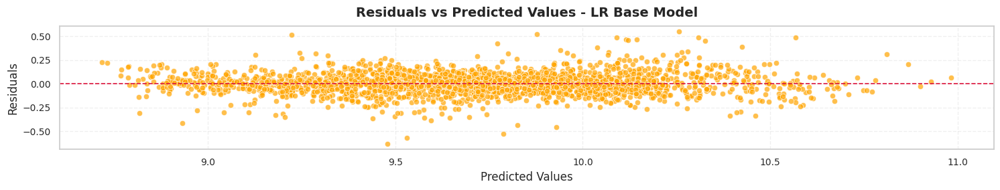

In [72]:
# Linearity check: Plot residuals vs fitted values
y_test_flat = y_test.values.ravel()
y_pred_test_flat = y_pred_test_LR.ravel()
analyze_residuals(y_test_flat, y_pred_test_flat, title="Residuals vs Predicted Values - LR Base Model", color="orange")


Check normality in residual distribution

In [73]:
def plot_residual_diagnostics_from_preds(y_true, y_pred, figsize=(12, 5), bins=30, color='purple'):
    # Compute residuals
    residuals = y_true - y_pred

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # Histogram with KDE
    sns.histplot(residuals, kde=True, color=color, stat='density', bins=bins, ax=axes[0])
    axes[0].set_title("Distribution of Residuals", fontsize=14, weight='bold')
    axes[0].set_xlabel("Residuals")
    axes[0].grid(True, linestyle='--', alpha=0.4)

    # Q-Q Plot
    stats.probplot(residuals, dist="norm", plot=axes[1])
    axes[1].set_title("Q-Q Plot of Residuals", fontsize=14, weight='bold')
    axes[1].grid(True, linestyle='--', alpha=0.4)

    plt.tight_layout()
    plt.show()


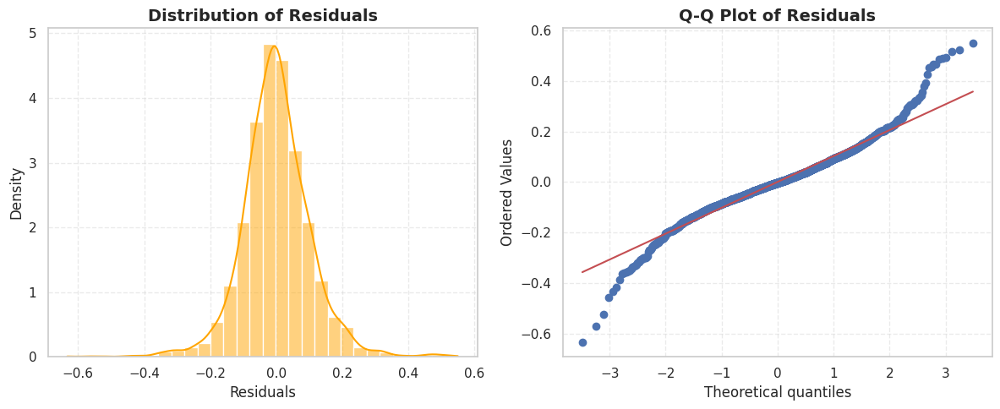

In [74]:
# Check the normality of residuals by plotting their distribution
plot_residual_diagnostics_from_preds(y_test_flat, y_pred_test_flat, figsize=(12, 5), bins=30,color='orange')


Check multicollinearity using Variance Inflation Factor (VIF) and handle features with high VIF.

In [75]:
def calculate_vif(X, threshold=10.0, return_df=False):
    """
    Calculates Variance Inflation Factor (VIF) for each feature and returhn feature with high ViF.
    """
    vif_df = pd.DataFrame()
    vif_df["feature"] = X.columns
    vif_df["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    high_vif = vif_df[vif_df["VIF"] > threshold].sort_values("VIF", ascending=False)

    if return_df:
        return vif_df.sort_values("VIF", ascending=False)

    return high_vif["feature"].tolist()


In [76]:
def prune_features_by_vif_with_tracking(X, threshold=10.0):
    """
    Iteratively prunes features with high VIF and tracks VIF values across iterations.

    """
    X_iter = X.copy()
    dropped_features = []
    iteration = 0
    vif_history = {}

    while True:
        iteration += 1
        vif_df = calculate_vif(X_iter, threshold=0, return_df=True)
        vif_df = vif_df.set_index("feature")["VIF"]

        for feature in X.columns:
            if feature not in vif_history:
                vif_history[feature] = []
            vif_value = vif_df.get(feature, 0)
            vif_history[feature].append(round(vif_value, 3))

        high_vif_features = vif_df[vif_df > threshold].sort_values(ascending=False).index.tolist()
        if not high_vif_features:
            break

        feature_to_drop = high_vif_features[0]
        X_iter = X_iter.drop(columns=[feature_to_drop])
        dropped_features.append(feature_to_drop)

    max_iters = iteration
    for feature in vif_history:
        vif_history[feature] += [0] * (max_iters - len(vif_history[feature]))

    vif_tracking_df = pd.DataFrame(vif_history).T
    vif_tracking_df.columns = [f"Iteration {i+1}" for i in range(max_iters)]
    vif_tracking_df.index.name = "Feature"

    return X_iter, dropped_features, vif_tracking_df


In [77]:
def filter_vif_tracking(vif_tracking_df, threshold=5):
    """
    Filters the VIF tracking DataFrame based on the given threshold.
    """
    numeric_df = vif_tracking_df.apply(pd.to_numeric, errors='coerce')

    #Columns where any VIF > threshold
    cols_to_keep = (numeric_df > threshold).any(axis=0)
    filtered_cols_df = numeric_df.loc[:, cols_to_keep]
    rows_to_keep = (filtered_cols_df > threshold).any(axis=1)
    fully_filtered_df = filtered_cols_df.loc[rows_to_keep]

    return fully_filtered_df

In [78]:
# Check for multicollinearity and handle
high_vif_features = calculate_vif(X_train_LR, threshold=5.0)
my_log("High VIF Features", f"Features with high VIF: {high_vif_features}")
X_train_pruned, removed, vif_tracking_df = prune_features_by_vif_with_tracking(X_train_LR, threshold=5.0)


High VIF Features 
 Features with high VIF: ['Drive_chain_front', 'Safety_security_Driver-side_airbag', 'Previous_owners_1.0', 'Safety_security_ABS', 'Comfort_convenience_Power_windows', 'Safety_security_Passenger-side_airbag', 'Vat_VAT deductible', 'Safety_security_Power_steering', 'Safety_security_Side_airbag', 'Safety_security_Electronic_stability_control', 'Comfort_convenience_Parking_assist_system_sensors_rear', 'Comfort_convenience_Park_Distance_Control', 'Fuel_Diesel', 'Safety_security_Central_door_lock', 'Make_model_Renault Espace', 'Extras_Alloy_wheels', 'Comfort_convenience_Electrical_side_mirrors', 'Entertainment_media_Bluetooth', 'Entertainment_media_On-board_computer', 'Make_model_Opel Insignia', 'Safety_security_Isofix', 'Hp_kw', 'Gears_6.0', 'Entertainment_media_Radio', 'Body_type_Van', 'Type_Used', 'Safety_security_Tire_pressure_monitoring_system', 'Comfort_convenience_Multi-function_steering_wheel', 'Displacement_cc', 'Comfort_convenience_Rain_sensor', 'Safety_security

In [79]:
print("\nDropped features:", removed)
print("\nVIF Tracking DataFrame:")
sorted_filtered_vif_df = vif_tracking_df.sort_values(by="Iteration 1", ascending=False)
sorted_filtered_vif_df


Dropped features: ['Drive_chain_front', 'Safety_security_Driver-side_airbag', 'Safety_security_ABS', 'Previous_owners_1.0', 'Comfort_convenience_Power_windows', 'Vat_VAT deductible', 'Safety_security_Passenger-side_airbag', 'Safety_security_Power_steering', 'Comfort_convenience_Parking_assist_system_sensors_rear', 'Safety_security_Electronic_stability_control', 'Safety_security_Side_airbag', 'Fuel_Diesel', 'Make_model_Renault Espace', 'Safety_security_Central_door_lock', 'Extras_Alloy_wheels', 'Comfort_convenience_Electrical_side_mirrors', 'Entertainment_media_Bluetooth', 'Entertainment_media_On-board_computer', 'Safety_security_Isofix', 'Comfort_convenience_Park_Distance_Control', 'Entertainment_media_Radio', 'Gears_6.0', 'Safety_security_Tire_pressure_monitoring_system', 'Type_Used', 'Comfort_convenience_Multi-function_steering_wheel', 'Comfort_convenience_Rain_sensor', 'Hp_kw', 'Safety_security_Daytime_running_lights', 'Comfort_convenience_Cruise_control', 'Make_model_Opel Insignia

,Iteration 1,Iteration 2,Iteration 3,Iteration 4,Iteration 5,Iteration 6,Iteration 7,Iteration 8,Iteration 9,Iteration 10,Iteration 11,Iteration 12,Iteration 13,Iteration 14,Iteration 15,Iteration 16,Iteration 17,Iteration 18,Iteration 19,Iteration 20,Iteration 21,Iteration 22,Iteration 23,Iteration 24,Iteration 25,Iteration 26,Iteration 27,Iteration 28,Iteration 29,Iteration 30,Iteration 31,Iteration 32
Feature,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Drive_chain_front,62.065,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
Safety_security_Driver-side_airbag,30.395,30.120,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
Previous_owners_1.0,29.312,26.428,26.258,25.986,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
Safety_security_ABS,27.764,27.532,27.229,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
Comfort_convenience_Power_windows,22.991,22.805,22.453,21.950,21.740,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Extras_Cab_or_rented_Car,1.136,1.136,1.134,1.133,1.132,1.132,1.132,1.132,1.132,1.128,1.128,1.127,1.126,1.126,1.126,1.124,1.123,1.123,1.122,1.122,1.122,1.122,1.122,1.121,1.111,1.111,1.111,1.111,1.111,1.109,1.109,1.108
Comfort_convenience_Auxiliary_heating,1.092,1.092,1.092,1.092,1.092,1.091,1.091,1.091,1.091,1.089,1.089,1.089,1.088,1.088,1.088,1.088,1.088,1.087,1.087,1.086,1.086,1.086,1.086,1.086,1.086,1.085,1.085,1.085,1.085,1.085,1.085,1.085
Fuel_Other,1.086,1.086,1.085,1.084,1.084,1.084,1.084,1.084,1.083,1.083,1.083,1.083,1.058,1.058,1.058,1.057,1.057,1.057,1.057,1.057,1.056,1.056,1.056,1.056,1.056,1.056,1.056,1.056,1.056,1.055,1.055,1.055


In [80]:
X_train_pruned.shape
# Assuming `removed_features` contains the list of dropped columns
X_test_pruned = X_test.drop(columns=removed, errors='ignore')
X_test_pruned.shape

(2849, 86)

In [81]:
#Build Final Linear Regression model after taking care of ViF
#Building model on pruned features
LR_ViF_model = LinearRegression()
LR_ViF_model.fit(X_train_pruned, y_train)
LR_ViF_model_model_coef = LR_Base_model.coef_.ravel()  # Flatten coefficients
intercept_df,coef_df= store_model_results('Linear_Regression_ViF', LR_ViF_model, feature_names=X_train_pruned.columns.tolist())

In [82]:
intercept_df

,Model,Intercept
0,Linear_Regression_Base,[9.868939038159025]
1,Linear_Regression_ViF,9.905


In [83]:
coef_df

,Feature,Linear_Regression_Base_Coefficient,Linear_Regression_ViF_Coefficient
0,Age,-0.093,-0.105
1,Body_type_Other,-0.054,0.017
2,Body_type_Sedans,0.000,-0.012
3,Body_type_Station wagon,0.005,-0.018
4,Body_type_Van,0.000,0.193
...,...,...,...
112,Type_New,0.029,0.040
113,Type_Used,-0.029,NaN
114,Upholstery_type_Part/Full Leather,0.015,0.031
115,Vat_VAT deductible,0.005,NaN


In [84]:
#Predict
y_pred_train_vif , y_pred_test_vif = predict_and_store(LR_ViF_model, X_train_pruned, X_test_pruned)

In [85]:
results = store_evaluation_metrics_pair('Linear_Regression_ViF', y_train, y_pred_train_vif, X_train_pruned, y_test, y_pred_test_vif, X_test_pruned)
results.T

,0,1,2,3
Model,Linear_Regression_Base_train,Linear_Regression_Base_test,Linear_Regression_ViF_train,Linear_Regression_ViF_test
R2,0.930,0.931,0.910,0.912
MAE,0.077,0.076,0.088,0.086
MSE,0.011,0.011,0.014,0.014
RMSE,0.105,0.104,0.119,0.117
Adjusted R2,0.930,0.928,0.910,0.909


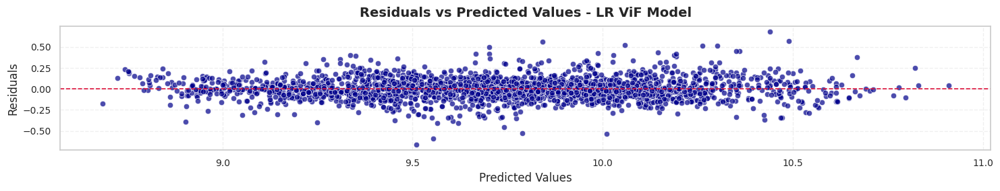

In [86]:
y_pred_test_vif_flat = y_pred_test_vif.ravel()
analyze_residuals(y_test_flat, y_pred_test_vif_flat, title="Residuals vs Predicted Values - LR ViF Model", color="darkblue")

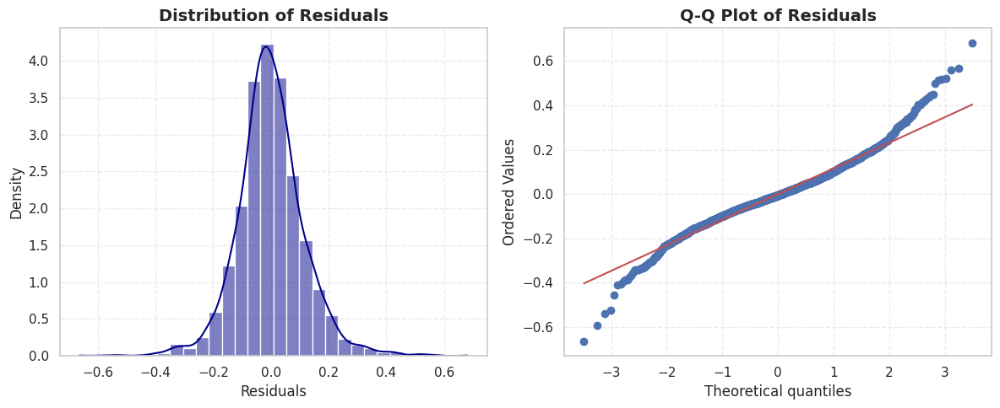

In [87]:
plot_residual_diagnostics_from_preds(y_test_flat, y_pred_test_vif_flat, figsize=(12, 5), bins=30,color='darkblue')

Based on the evaluation metrics:

- Both the base Linear Regression model and the Linear Regression model after VIF pruning show similar performance on both the training and test sets, with R-squared values around 0.91-0.93.
- The MAE, MSE, and RMSE values are also quite similar for both models.
- The Adjusted R-squared values are also very close, indicating that adding more features in the base model did not significantly improve the model's explanatory power after accounting for the number of predictors.

This suggests that removing features with high VIF did not significantly impact the model's predictive performance in this case. This could be due to several factors:
- The multicollinearity, while present, might not have been severe enough to significantly degrade the base model's performance.
- The features with high VIF might not have been strongly correlated with the target variable.

### **3.2 Ridge Regression Implementation** <font color =red> [10 marks] </font>

#### **3.2.1** <font color =red> [2 marks] </font>
Define a list of random alpha values

In [88]:
X_train_Ridge = pd.read_csv('/content/sample_data/Car_Price/X_train_processed.csv')
X_test_Ridge = pd.read_csv('/content/sample_data/Car_Price/X_test_processed.csv')
y_train_Ridge = pd.read_csv('/content/sample_data/Car_Price/y_train_processed.csv')
y_test_Ridge = pd.read_csv('/content/sample_data/Car_Price/y_test_processed.csv')

In [89]:
# List of alphas to tune for Ridge regularisation
np.random.seed(42)
alphas_random = np.round(np.random.uniform(0.001, 100, size=15), 4)
my_log("Random Alpha Values", f"Generated random alphas: {alphas_random}")


Random Alpha Values 
 Generated random alphas: [37.4546 95.0715 73.1997 59.8662 15.6027 15.6003  5.8093 86.6177 60.1119
 70.8075  2.0594 96.991  83.2444 21.2347 18.1833]


#### **3.2.2** <font color =red> [4 marks] </font>
Apply Ridge Regularisation and find the best value of alpha from the list

In [90]:
def evaluate_ridge_models(X_train, y_train, X_test, y_test, alphas):
    results = []

    for alpha in alphas:
        model = Ridge(alpha=alpha)
        model.fit(X_train, y_train.values.ravel())

        # Predictions
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Train metrics
        r2_train = r2_score(y_train, y_pred_train)
        mae_train = mean_absolute_error(y_train, y_pred_train)
        mse_train = mean_squared_error(y_train, y_pred_train)
        rmse_train = np.sqrt(mse_train)

        # Test metrics
        r2_test = r2_score(y_test, y_pred_test)
        mae_test = mean_absolute_error(y_test, y_pred_test)
        mse_test = mean_squared_error(y_test, y_pred_test)
        rmse_test = np.sqrt(mse_test)

        results.append({
            "Alpha": alpha,
            "Train_R2": round(r2_train, 4),
            "Test_R2": round(r2_test, 4),
            "Train_MAE": round(mae_train, 4),
            "Test_MAE": round(mae_test, 4),
            "Train_MSE": round(mse_train, 4),
            "Test_MSE": round(mse_test, 4),
            "Train_RMSE": round(rmse_train, 4),
            "Test_RMSE": round(rmse_test, 4)
        })

    return pd.DataFrame(results).sort_values(by="Test_R2", ascending=False)


In [91]:
# Applying Ridge regression
def run_ridge_for_alphas(X_train, y_train, X_test, y_test, alpha_list):
    """
    Evaluates Ridge regression for each alpha in alpha_list using evaluate_ridge_models().
    """
    results_df = pd.DataFrame()

    for alpha in alpha_list:
        result = evaluate_ridge_models(X_train, y_train, X_test, y_test, [alpha])
        results_df = pd.concat([results_df, result], ignore_index=True)

    return results_df


In [92]:
# Plot train and test scores against alpha
results_df = run_ridge_for_alphas(X_train_Ridge, y_train_Ridge, X_test_Ridge, y_test_Ridge, alphas_random)
results_df


,Alpha,Train_R2,Test_R2,Train_MAE,Test_MAE,Train_MSE,Test_MSE,Train_RMSE,Test_RMSE
0,37.455,0.928,0.928,0.079,0.077,0.011,0.011,0.106,0.106
1,95.072,0.924,0.924,0.081,0.080,0.012,0.012,0.110,0.109
2,73.200,0.926,0.926,0.080,0.079,0.012,0.012,0.108,0.108
3,59.866,0.927,0.927,0.080,0.078,0.012,0.011,0.108,0.107
4,15.603,0.930,0.930,0.078,0.076,0.011,0.011,0.105,0.105
5,15.600,0.930,0.930,0.078,0.076,0.011,0.011,0.105,0.105
6,5.809,0.930,0.930,0.077,0.076,0.011,0.011,0.105,0.104
7,86.618,0.925,0.925,0.081,0.080,0.012,0.012,0.109,0.109
8,60.112,0.927,0.927,0.080,0.078,0.012,0.011,0.108,0.107
9,70.808,0.926,0.926,0.080,0.079,0.012,0.012,0.108,0.108


In [93]:
def plot_all_scores_from_df(df, log_scale=True):
    """
    Plots Train vs Test curves for R2, RMSE, and MAE in a 1x3 subplot layout.
    """
    metrics = ["R2", "RMSE", "MAE"]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    for i, metric in enumerate(metrics):
        ax = axes[i]
        train_col = f"Train_{metric}"
        test_col = f"Test_{metric}"

        ax.plot(df["Alpha"], df[train_col], label=f"Train {metric}", marker='o', color='navy')
        ax.plot(df["Alpha"], df[test_col], label=f"Test {metric}", marker='s', color='darkorange')

        # Highlight best alpha
        best_idx = df[test_col].idxmax() if metric == "R2" else df[test_col].idxmin()
        best_alpha = df.loc[best_idx, "Alpha"]
        ax.axvline(x=best_alpha, color='green', linestyle='--', label=f"Best Alpha = {best_alpha:.4f}")

        ax.set_xlabel("Alpha", fontsize=11)
        ax.set_ylabel(metric, fontsize=11)
        ax.set_title(f"{metric} Across Alphas", fontsize=13, weight='bold')
        if log_scale:
            ax.set_xscale("log")
        ax.grid(True, linestyle='--', alpha=0.4)
        ax.legend(fontsize=9)

    plt.tight_layout()
    plt.show()


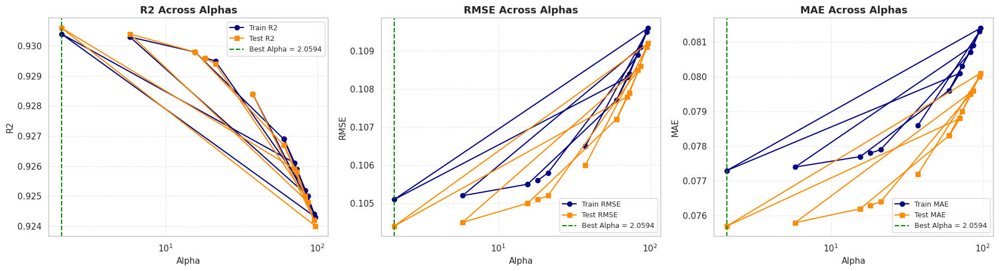

In [94]:
plot_all_scores_from_df(results_df)

Find the best alpha value.

In [95]:
def get_best_alpha_by_neg_mae(results_df):
    """
    Identifies the alpha value with the lowest Test MAE (i.e., highest negative MAE).

    """
    results_df = results_df.copy()
    results_df["Neg_Test_MAE"] = -results_df["Test_MAE"]
    best_idx = results_df["Neg_Test_MAE"].idxmax()
    best_alpha = results_df.loc[best_idx, "Alpha"]
    best_neg_mae = results_df.loc[best_idx, "Neg_Test_MAE"]

    return best_alpha, best_neg_mae


In [96]:
# Best alpha value
best_alpha ,neg_mae_series = get_best_alpha_by_neg_mae(results_df)
my_log("Best Alpha", f"Best alpha: {best_alpha}")

# Best score (negative MAE)
my_log("Negative MAE", f"Negative MAE: {neg_mae_series}")


Best Alpha 
 Best alpha: 2.0594
Negative MAE 
 Negative MAE: -0.0757


We will get some best value of alpha above. This however is not the most accurate value but the best value from the given list. Now we have a rough estimate of the range that best alpha falls in. Let us do another iteration over the values in a smaller range.

#### **3.2.3** <font color =red> [4 marks] </font>
Fine tune by taking a closer range of alpha based on the previous result.

In [97]:
# Take a smaller range of alpha to test
alphas_fine = np.round(np.linspace(1.5, 2.5, 15), 4)
my_log("Fine Alpha Values", f"Generated fine alphas: {alphas_fine}")


Fine Alpha Values 
 Generated fine alphas: [1.5    1.5714 1.6429 1.7143 1.7857 1.8571 1.9286 2.     2.0714 2.1429
 2.2143 2.2857 2.3571 2.4286 2.5   ]


In [98]:
# Applying Ridge regression
results_df1 = run_ridge_for_alphas(X_train_Ridge, y_train_Ridge, X_test_Ridge, y_test_Ridge, alphas_fine)
results_df1


,Alpha,Train_R2,Test_R2,Train_MAE,Test_MAE,Train_MSE,Test_MSE,Train_RMSE,Test_RMSE
0,1.500,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
1,1.571,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
2,1.643,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
3,1.714,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
4,1.786,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
5,1.857,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
6,1.929,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
7,2.000,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
8,2.071,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104
9,2.143,0.930,0.931,0.077,0.076,0.011,0.011,0.105,0.104


Plot the error-alpha graph again and find the actual optimal value for alpha.

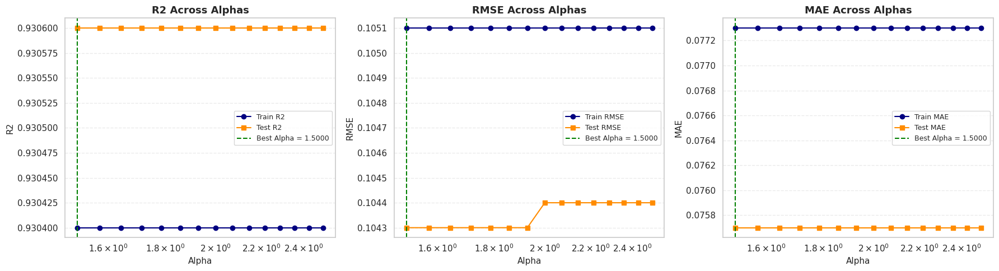

Best Alpha 
 Best alpha: 1.5
Negative MAE 
 Negative MAE: -0.0757


In [99]:
# Plot train and test scores against alpha

plot_all_scores_from_df(results_df1)

# Best alpha value
best_alpha ,neg_mae_series = get_best_alpha_by_neg_mae(results_df1)
my_log("Best Alpha", f"Best alpha: {best_alpha}")


# Best score (negative MAE)
my_log("Negative MAE", f"Negative MAE: {neg_mae_series}")


In [100]:
# Set best alpha for Ridge regression
model = Ridge(alpha=best_alpha)
model.fit(X_train_Ridge, y_train_Ridge.values.ravel())

# Fit the Ridge model to get the coefficients of the fitted model
intercept_df,coef_df=store_model_results('Riddge_BestAlpha',model,X_train_Ridge.columns.tolist())


In [101]:
coef_df

,Feature,Linear_Regression_Base_Coefficient,Linear_Regression_ViF_Coefficient,Riddge_BestAlpha_Coefficient
0,Age,-0.093,-0.105,-0.093
1,Body_type_Other,-0.054,0.017,-0.057
2,Body_type_Sedans,0.000,-0.012,0.000
3,Body_type_Station wagon,0.005,-0.018,0.005
4,Body_type_Van,0.000,0.193,0.001
...,...,...,...,...
112,Type_New,0.029,0.040,0.030
113,Type_Used,-0.029,NaN,-0.029
114,Upholstery_type_Part/Full Leather,0.015,0.031,0.015
115,Vat_VAT deductible,0.005,NaN,0.005


In [102]:
# Show the coefficients for each feature
coef_df[['Feature','Riddge_BestAlpha_Coefficient']].T


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116
Feature,Age,Body_type_Other,Body_type_Sedans,Body_type_Station wagon,Body_type_Van,Comfort_convenience_Armrest,Comfort_convenience_Automatic_climate_control,Comfort_convenience_Auxiliary_heating,Comfort_convenience_Cruise_control,Comfort_convenience_Electric_tailgate,Comfort_convenience_Electrical_side_mirrors,Comfort_convenience_Electrically_adjustable_seats,Comfort_convenience_Electrically_heated_windsh...,Comfort_convenience_Heads-up_display,Comfort_convenience_Heated_steering_wheel,Comfort_convenience_Hill_Holder,Comfort_convenience_Keyless_central_door_lock,Comfort_convenience_Leather_steering_wheel,Comfort_convenience_Light_sensor,Comfort_convenience_Lumbar_support,Comfort_convenience_Massage_seats,Comfort_convenience_Multi-function_steering_wheel,Comfort_convenience_Navigation_system,Comfort_convenience_Panorama_roof,Comfort_convenience_Park_Distance_Control,Comfort_convenience_Parking_assist_system_camera,Comfort_convenience_Parking_assist_system_self...,Comfort_convenience_Parking_assist_system_sens...,Comfort_convenience_Parking_assist_system_sens...,Comfort_convenience_Power_windows,Comfort_convenience_Rain_sensor,Comfort_convenience_Seat_heating,Comfort_convenience_Seat_ventilation,Comfort_convenience_Split_rear_seats,Comfort_convenience_Start-stop_system,Comfort_convenience_Sunroof,Comfort_convenience_Tinted_windows,Cons_comb,Displacement_cc,Drive_chain_front,Entertainment_media_Bluetooth,Entertainment_media_CD_player,Entertainment_media_Digital_radio,Entertainment_media_Hands-free_equipment,Entertainment_media_MP3,Entertainment_media_On-board_computer,Entertainment_media_Radio,Entertainment_media_Sound_system,Entertainment_media_USB,Extras_Alloy_wheels,Extras_Cab_or_rented_Car,Extras_Catalytic_Converter,Extras_Roof_rack,Extras_Shift_paddles,Extras_Ski_bag,Extras_Sport_package,Extras_Sport_seats,Extras_Sport_suspension,Extras_Touch_screen,Extras_Trailer_hitch,Extras_Voice_Control,Extras_Winter_tyres,Fuel_Diesel,Fuel_Other,Gearing_type_Manual,Gearing_type_Semi-automatic,Gears_6.0,Gears_7.0,Gears_Other,Hp_kw,Inspection_new_1,Km,Make_model_Audi A3,Make_model_Opel Astra,Make_model_Opel Corsa,Make_model_Opel Insignia,Make_model_Other,Make_model_Renault Clio,Make_model_Renault Espace,Paint_type_Other,Paint_type_Uni/basic,Previous_owners_1.0,Previous_owners_2.0,Previous_owners_Other,Safety_security_ABS,Safety_security_Adaptive_Cruise_Control,Safety_security_Adaptive_headlights,Safety_security_Alarm_system,Safety_security_Blind_spot_monitor,Safety_security_Central_door_lock,Safety_security_Central_door_lock_with_remote_...,Safety_security_Daytime_running_lights,Safety_security_Driver-side_airbag,Safety_security_Driver_drowsiness_detection,Safety_security_Electronic_stability_control,Safety_security_Emergency_brake_assistant,Safety_security_Emergency_system,Safety_security_Fog_lights,Safety_security_Head_airbag,Safety_security_Immobilizer,Safety_security_Isofix,Safety_security_LED_Daytime_Running_Lights,Safety_security_LED_Headlights,Safety_security_Lane_departure_warning_system,Safety_security_Passenger-side_airbag,Safety_security_Power_steering,Safety_security_Rear_airbag,Safety_security_Side_airbag,Safety_security_Tire_pressure_monitoring_system,Safety_security_Traction_control,Safety_security_Traffic_sign_recognition,Safety_security_Xenon_headlights,Type_New,Type_Used,Upholstery_type_Part/Full Leather,Vat_VAT deductible,Weight_kg
Riddge_BestAlpha_Coefficient,-0.093,-0.057,0.000,0.005,0.001,-0.000,0.011,-0.005,0.017,-0.016,-0.008,-0.009,0.021,0.048,0.011,0.006,0.017,0.016,0.003,-0.015,0.007,0.011,0.012,-0.013,0.032,0.020,0.024,0.004,-0.016,-0.004,-0.000,0.010,0.015,0.

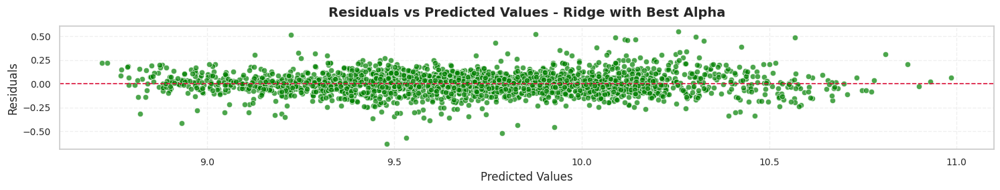

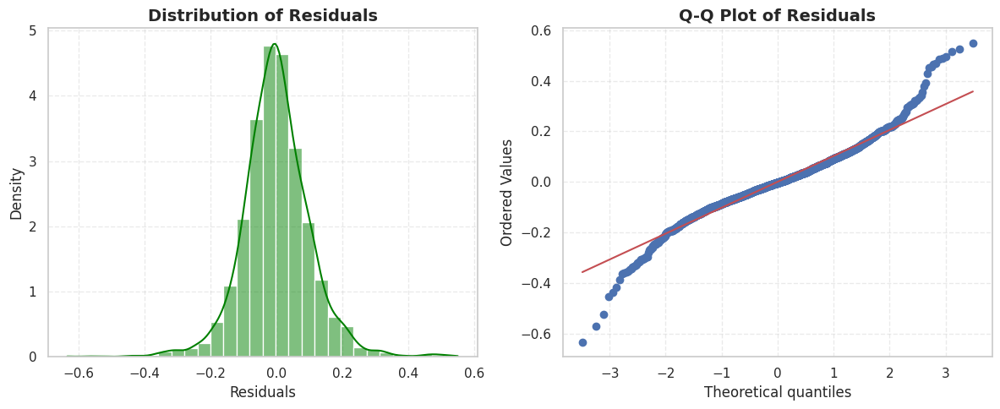

In [103]:
# Evaluate the Ridge model on the test data
y_pred_train_Ridge_best = model.predict(X_train_Ridge)
y_pred_test_Ridge_best = model.predict(X_test_Ridge)
y_test_flat = y_test_Ridge.values.ravel()
y_pred_test_flat = y_pred_test_Ridge_best.ravel()
analyze_residuals(y_test_flat, y_pred_test_Ridge_best, title="Residuals vs Predicted Values - Ridge with Best Alpha", color="green")
plot_residual_diagnostics_from_preds(y_test_flat, y_pred_test_Ridge_best, figsize=(12, 5), bins=30, color='green')


In [104]:
results = store_evaluation_metrics_pair('Riddge_BestAlpha', y_train_Ridge, y_pred_train_Ridge_best, X_train_Ridge, y_test_Ridge, y_pred_test_Ridge_best, X_test_Ridge)
results

,Model,R2,MAE,MSE,RMSE,Adjusted R2
0,Linear_Regression_Base_train,0.930,0.077,0.011,0.105,0.930
1,Linear_Regression_Base_test,0.931,0.076,0.011,0.104,0.928
2,Linear_Regression_ViF_train,0.910,0.088,0.014,0.119,0.910
3,Linear_Regression_ViF_test,0.912,0.086,0.014,0.117,0.909
4,Riddge_BestAlpha_train,0.930,0.077,0.011,0.105,0.930
5,Riddge_BestAlpha_test,0.931,0.076,0.011,0.104,0.928


### **3.3 Lasso Regression Implementation** <font color =red> [10 marks] </font>

#### **3.3.1** <font color =red> [2 marks] </font>
Define a list of random alpha values

In [105]:
X_train_lasso = pd.read_csv('/content/sample_data/Car_Price/X_train_processed.csv')
X_test_lasso = pd.read_csv('/content/sample_data/Car_Price/X_test_processed.csv')
y_train_lasso = pd.read_csv('/content/sample_data/Car_Price/y_train_processed.csv')
y_test_lasso = pd.read_csv('/content/sample_data/Car_Price/y_test_processed.csv')

In [106]:
# List of alphas to tune for Lasso regularisation
alphas_lasso = np.round(np.logspace(-3, 1, 30), 4)
alphas_lasso


array([1.0000e-03, 1.4000e-03, 1.9000e-03, 2.6000e-03, 3.6000e-03,
       4.9000e-03, 6.7000e-03, 9.2000e-03, 1.2700e-02, 1.7400e-02,
       2.4000e-02, 3.2900e-02, 4.5200e-02, 6.2100e-02, 8.5300e-02,
       1.1720e-01, 1.6100e-01, 2.2120e-01, 3.0390e-01, 4.1750e-01,
       5.7360e-01, 7.8800e-01, 1.0826e+00, 1.4874e+00, 2.0434e+00,
       2.8072e+00, 3.8566e+00, 5.2983e+00, 7.2790e+00, 1.0000e+01])

#### **3.3.2** <font color =red> [4 marks] </font>
Apply Ridge Regularisation and find the best value of alpha from the list

In [107]:
def evaluate_lasso_models(X_train, y_train, X_test, y_test, alpha_list):
    """
    Evaluates Lasso regression across a list of alphas.
    Returns a DataFrame of metrics for each alpha.
    """
    results = []

    for alpha in alpha_list:
        model = Lasso(alpha=alpha, max_iter=10000)
        model.fit(X_train, y_train.values.ravel())
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        results.append({
        "Alpha": alpha,
        "Train_R2": r2_score(y_train, y_pred_train),
        "Test_R2": r2_score(y_test, y_pred_test),
        "Train_MAE": mean_absolute_error(y_train, y_pred_train),
        "Test_MAE": mean_absolute_error(y_test, y_pred_test),
        "Train_RMSE": mean_squared_error(y_train, y_pred_train) ** 0.5,
        "Test_RMSE": mean_squared_error(y_test, y_pred_test) ** 0.5
    })


    return pd.DataFrame(results)

In [108]:
# Initialise Lasso regression model

results_lasso=evaluate_lasso_models(X_train_lasso, y_train_lasso, X_test_lasso, y_test_lasso, alphas_lasso)
results_lasso

,Alpha,Train_R2,Test_R2,Train_MAE,Test_MAE,Train_RMSE,Test_RMSE
0,0.001,0.924,0.924,0.081,0.079,0.110,0.109
1,0.001,0.921,0.921,0.083,0.081,0.112,0.111
2,0.002,0.918,0.918,0.085,0.083,0.114,0.114
3,0.003,0.914,0.913,0.087,0.086,0.117,0.117
4,0.004,0.909,0.908,0.090,0.089,0.120,0.120
5,0.005,0.902,0.901,0.094,0.092,0.125,0.124
6,0.007,0.891,0.891,0.100,0.098,0.132,0.131
7,0.009,0.871,0.872,0.111,0.109,0.143,0.142
8,0.013,0.842,0.843,0.126,0.123,0.159,0.157
9,0.017,0.797,0.800,0.146,0.143,0.180,0.177


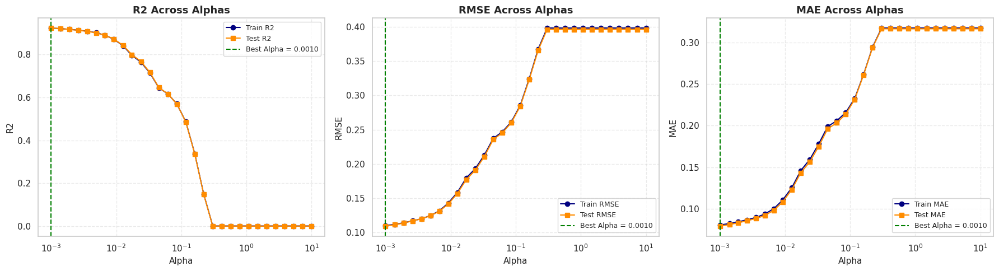

In [109]:
# Plot train and test scores against alpha

plot_all_scores_from_df(results_lasso)

In [110]:
# Best alpha value
best_alpha, neg_mae= get_best_alpha_by_neg_mae(results_lasso)
my_log(f"Best Alpha",{best_alpha})

# Best score (negative MAE)
my_log(f"Negative MAE",{neg_mae})


Best Alpha 
 {np.float64(0.001)}
Negative MAE 
 {np.float64(-0.07942451168932527)}


#### **3.3.3** <font color =red> [4 marks] </font>
Fine tune by taking a closer range of alpha based on the previous result.

In [111]:
# List of alphas to tune for Lasso regularization
alphas_lasso_fine = np.round(np.linspace(0.0004, 0.002, 30), 6)
alphas_lasso_fine



array([0.0004  , 0.000455, 0.00051 , 0.000566, 0.000621, 0.000676,
       0.000731, 0.000786, 0.000841, 0.000897, 0.000952, 0.001007,
       0.001062, 0.001117, 0.001172, 0.001228, 0.001283, 0.001338,
       0.001393, 0.001448, 0.001503, 0.001559, 0.001614, 0.001669,
       0.001724, 0.001779, 0.001834, 0.00189 , 0.001945, 0.002   ])

In [112]:
# Tuning Lasso hyperparameters
results_lasso=evaluate_lasso_models(X_train_lasso, y_train_lasso, X_test_lasso, y_test_lasso, alphas_lasso_fine)
results_lasso


,Alpha,Train_R2,Test_R2,Train_MAE,Test_MAE,Train_RMSE,Test_RMSE
0,0.000,0.928,0.928,0.078,0.077,0.107,0.106
1,0.000,0.928,0.928,0.078,0.077,0.107,0.106
2,0.001,0.927,0.928,0.079,0.077,0.107,0.107
3,0.001,0.927,0.927,0.079,0.077,0.108,0.107
4,0.001,0.927,0.927,0.079,0.078,0.108,0.107
5,0.001,0.926,0.926,0.079,0.078,0.108,0.107
6,0.001,0.926,0.926,0.079,0.078,0.108,0.108
7,0.001,0.925,0.926,0.080,0.078,0.109,0.108
8,0.001,0.925,0.925,0.080,0.079,0.109,0.108
9,0.001,0.925,0.925,0.080,0.079,0.109,0.109


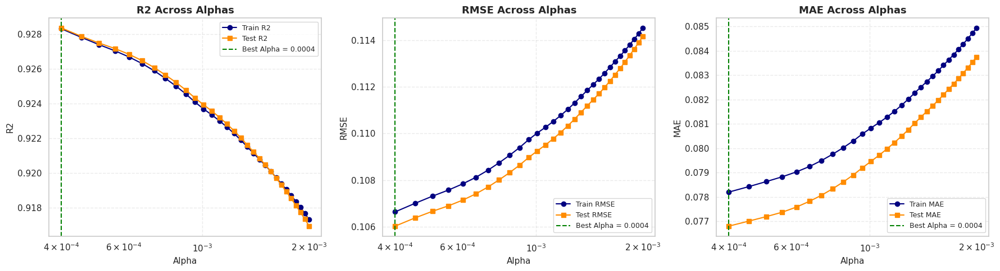

In [113]:
# Plot train and test scores against alpha
plot_all_scores_from_df(results_lasso)


In [114]:
# Best alpha value
best_alpha1, neg_mae= get_best_alpha_by_neg_mae(results_lasso)
my_log(f"Best Alpha",{best_alpha1})

# Best score (negative MAE)
my_log(f"Negative MAE",{neg_mae})


Best Alpha 
 {np.float64(0.0004)}
Negative MAE 
 {np.float64(-0.07680109443637607)}


In [115]:
# Set best alpha for Lasso regression
results_lasso=evaluate_lasso_models(X_train_lasso, y_train_lasso, X_test_lasso, y_test_lasso, [best_alpha1]) # best Alpha
print(results_lasso)
# Fit the Lasso model on scaled training data
# Get the coefficients of the fitted model



   Alpha  Train_R2  Test_R2  Train_MAE  Test_MAE  Train_RMSE  Test_RMSE
0  0.000     0.928    0.928      0.078     0.077       0.107      0.106


In [116]:
# Check the coefficients for each feature
model = Lasso(alpha=best_alpha1, max_iter=10000)
model.fit(X_train_lasso, y_train_lasso.values.ravel())
intercept_df,coef_df=store_model_results('Lssso_BestAlpha',model,X_train_lasso.columns.tolist())


In [117]:
coef_df

,Feature,Linear_Regression_Base_Coefficient,Linear_Regression_ViF_Coefficient,Riddge_BestAlpha_Coefficient,Lssso_BestAlpha_Coefficient
0,Age,-0.093,-0.105,-0.093,-0.094
1,Body_type_Other,-0.054,0.017,-0.057,-0.050
2,Body_type_Sedans,0.000,-0.012,0.000,-0.000
3,Body_type_Station wagon,0.005,-0.018,0.005,-0.000
4,Body_type_Van,0.000,0.193,0.001,0.000
...,...,...,...,...,...
112,Type_New,0.029,0.040,0.030,0.019
113,Type_Used,-0.029,NaN,-0.029,-0.027
114,Upholstery_type_Part/Full Leather,0.015,0.031,0.015,0.015
115,Vat_VAT deductible,0.005,NaN,0.005,0.000


In [118]:
coef_df[['Feature','Lssso_BestAlpha_Coefficient']].T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116
Feature,Age,Body_type_Other,Body_type_Sedans,Body_type_Station wagon,Body_type_Van,Comfort_convenience_Armrest,Comfort_convenience_Automatic_climate_control,Comfort_convenience_Auxiliary_heating,Comfort_convenience_Cruise_control,Comfort_convenience_Electric_tailgate,Comfort_convenience_Electrical_side_mirrors,Comfort_convenience_Electrically_adjustable_seats,Comfort_convenience_Electrically_heated_windsh...,Comfort_convenience_Heads-up_display,Comfort_convenience_Heated_steering_wheel,Comfort_convenience_Hill_Holder,Comfort_convenience_Keyless_central_door_lock,Comfort_convenience_Leather_steering_wheel,Comfort_convenience_Light_sensor,Comfort_convenience_Lumbar_support,Comfort_convenience_Massage_seats,Comfort_convenience_Multi-function_steering_wheel,Comfort_convenience_Navigation_system,Comfort_convenience_Panorama_roof,Comfort_convenience_Park_Distance_Control,Comfort_convenience_Parking_assist_system_camera,Comfort_convenience_Parking_assist_system_self...,Comfort_convenience_Parking_assist_system_sens...,Comfort_convenience_Parking_assist_system_sens...,Comfort_convenience_Power_windows,Comfort_convenience_Rain_sensor,Comfort_convenience_Seat_heating,Comfort_convenience_Seat_ventilation,Comfort_convenience_Split_rear_seats,Comfort_convenience_Start-stop_system,Comfort_convenience_Sunroof,Comfort_convenience_Tinted_windows,Cons_comb,Displacement_cc,Drive_chain_front,Entertainment_media_Bluetooth,Entertainment_media_CD_player,Entertainment_media_Digital_radio,Entertainment_media_Hands-free_equipment,Entertainment_media_MP3,Entertainment_media_On-board_computer,Entertainment_media_Radio,Entertainment_media_Sound_system,Entertainment_media_USB,Extras_Alloy_wheels,Extras_Cab_or_rented_Car,Extras_Catalytic_Converter,Extras_Roof_rack,Extras_Shift_paddles,Extras_Ski_bag,Extras_Sport_package,Extras_Sport_seats,Extras_Sport_suspension,Extras_Touch_screen,Extras_Trailer_hitch,Extras_Voice_Control,Extras_Winter_tyres,Fuel_Diesel,Fuel_Other,Gearing_type_Manual,Gearing_type_Semi-automatic,Gears_6.0,Gears_7.0,Gears_Other,Hp_kw,Inspection_new_1,Km,Make_model_Audi A3,Make_model_Opel Astra,Make_model_Opel Corsa,Make_model_Opel Insignia,Make_model_Other,Make_model_Renault Clio,Make_model_Renault Espace,Paint_type_Other,Paint_type_Uni/basic,Previous_owners_1.0,Previous_owners_2.0,Previous_owners_Other,Safety_security_ABS,Safety_security_Adaptive_Cruise_Control,Safety_security_Adaptive_headlights,Safety_security_Alarm_system,Safety_security_Blind_spot_monitor,Safety_security_Central_door_lock,Safety_security_Central_door_lock_with_remote_...,Safety_security_Daytime_running_lights,Safety_security_Driver-side_airbag,Safety_security_Driver_drowsiness_detection,Safety_security_Electronic_stability_control,Safety_security_Emergency_brake_assistant,Safety_security_Emergency_system,Safety_security_Fog_lights,Safety_security_Head_airbag,Safety_security_Immobilizer,Safety_security_Isofix,Safety_security_LED_Daytime_Running_Lights,Safety_security_LED_Headlights,Safety_security_Lane_departure_warning_system,Safety_security_Passenger-side_airbag,Safety_security_Power_steering,Safety_security_Rear_airbag,Safety_security_Side_airbag,Safety_security_Tire_pressure_monitoring_system,Safety_security_Traction_control,Safety_security_Traffic_sign_recognition,Safety_security_Xenon_headlights,Type_New,Type_Used,Upholstery_type_Part/Full Leather,Vat_VAT deductible,Weight_kg
Lssso_BestAlpha_Coefficient,-0.094,-0.050,-0.000,-0.000,0.000,0.000,0.011,-0.000,0.012,-0.005,-0.004,-0.002,0.016,0.040,0.006,0.004,0.011,0.015,0.000,-0.013,0.000,0.010,0.009,-0.000,0.025,0.015,0.014,0.000,-0.000,-0.000,0.003,0.010,0.014,0.0

In [119]:
# Evaluate the Lasso model on the test data
results_lasso=evaluate_lasso_models(X_train_lasso, y_train_lasso, X_test_lasso, y_test_lasso, [best_alpha]) # best Alpha
print(results_lasso)


   Alpha  Train_R2  Test_R2  Train_MAE  Test_MAE  Train_RMSE  Test_RMSE
0  0.001     0.924    0.924      0.081     0.079       0.110      0.109


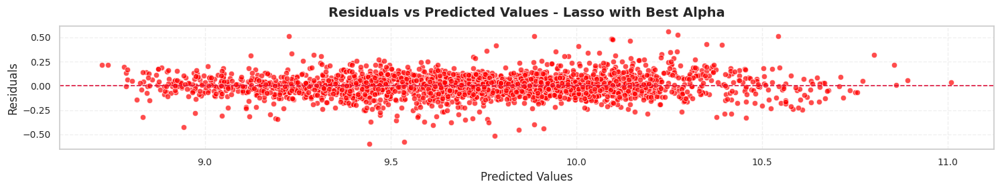

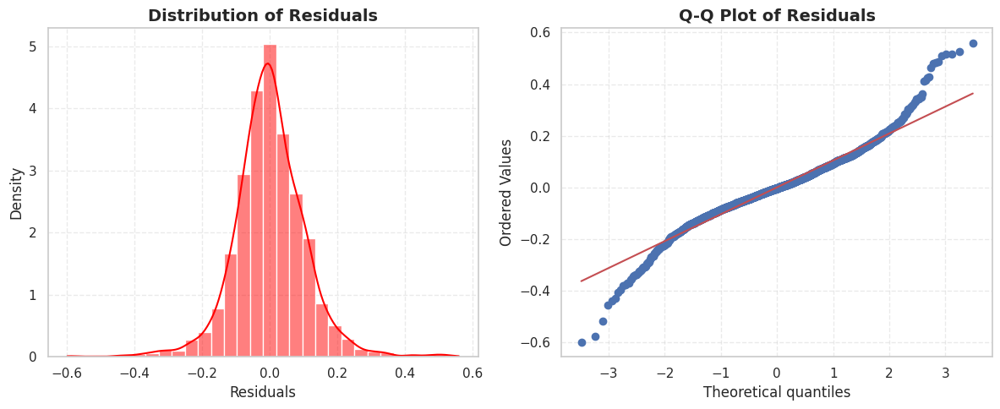

In [120]:
y_pred_train_lasso_best = model.predict(X_train_lasso)
y_pred_test_lasso_best = model.predict(X_test_lasso)
analyze_residuals(y_test_flat, y_pred_test_lasso_best, title="Residuals vs Predicted Values - Lasso with Best Alpha", color="red")
plot_residual_diagnostics_from_preds(y_test_flat, y_pred_test_lasso_best, figsize=(12, 5), bins=30, color='red')

In [121]:
results=store_evaluation_metrics_pair('Lssso_BestAlpha', y_train_lasso, y_pred_train_lasso_best, X_train_lasso, y_test_lasso, y_pred_test_lasso_best, X_test_lasso)
results

,Model,R2,MAE,MSE,RMSE,Adjusted R2
0,Linear_Regression_Base_train,0.930,0.077,0.011,0.105,0.930
1,Linear_Regression_Base_test,0.931,0.076,0.011,0.104,0.928
2,Linear_Regression_ViF_train,0.910,0.088,0.014,0.119,0.910
3,Linear_Regression_ViF_test,0.912,0.086,0.014,0.117,0.909
4,Riddge_BestAlpha_train,0.930,0.077,0.011,0.105,0.930
5,Riddge_BestAlpha_test,0.931,0.076,0.011,0.104,0.928
6,Lssso_BestAlpha_train,0.928,0.078,0.011,0.107,0.928
7,Lssso_BestAlpha_test,0.928,0.077,0.011,0.106,0.925


### **3.4 Regularisation Comparison & Analysis** <font color =red> [5 marks] </font>

#### **3.4.1** <font color =red> [2 marks] </font>
Compare the evaluation metrics for each model.

In [122]:
# Compare metrics for each model
results.T


,0,1,2,3,4,5,6,7
Model,Linear_Regression_Base_train,Linear_Regression_Base_test,Linear_Regression_ViF_train,Linear_Regression_ViF_test,Riddge_BestAlpha_train,Riddge_BestAlpha_test,Lssso_BestAlpha_train,Lssso_BestAlpha_test
R2,0.930,0.931,0.910,0.912,0.930,0.931,0.928,0.928
MAE,0.077,0.076,0.088,0.086,0.077,0.076,0.078,0.077
MSE,0.011,0.011,0.014,0.014,0.011,0.011,0.011,0.011
RMSE,0.105,0.104,0.119,0.117,0.105,0.104,0.107,0.106
Adjusted R2,0.930,0.928,0.910,0.909,0.930,0.928,0.928,0.925


#### **3.4.2** <font color =red> [3 marks] </font>
Compare the coefficients for the three models.

Also visualise a few of the largest coefficients and the coefficients of features dropped by Lasso.

In [123]:
# Compare highest coefficients and coefficients of eliminated features
coef_df


,Feature,Linear_Regression_Base_Coefficient,Linear_Regression_ViF_Coefficient,Riddge_BestAlpha_Coefficient,Lssso_BestAlpha_Coefficient
0,Age,-0.093,-0.105,-0.093,-0.094
1,Body_type_Other,-0.054,0.017,-0.057,-0.050
2,Body_type_Sedans,0.000,-0.012,0.000,-0.000
3,Body_type_Station wagon,0.005,-0.018,0.005,-0.000
4,Body_type_Van,0.000,0.193,0.001,0.000
...,...,...,...,...,...
112,Type_New,0.029,0.040,0.030,0.019
113,Type_Used,-0.029,NaN,-0.029,-0.027
114,Upholstery_type_Part/Full Leather,0.015,0.031,0.015,0.015
115,Vat_VAT deductible,0.005,NaN,0.005,0.000


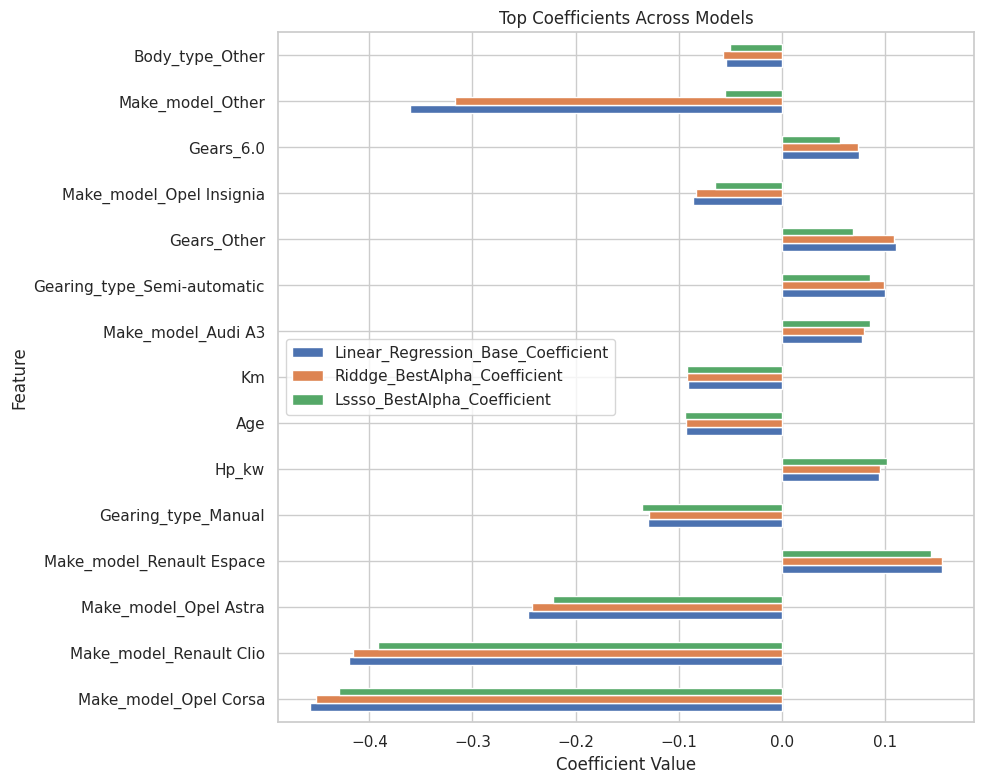

In [124]:
# Top N coefficients by magnitude
# Select top N features by absolute value in Lasso
top_n = 15
top_features = coef_df.loc[
    coef_df['Lssso_BestAlpha_Coefficient'].abs().nlargest(top_n).index,
    ['Feature', 'Linear_Regression_Base_Coefficient', 'Riddge_BestAlpha_Coefficient', 'Lssso_BestAlpha_Coefficient']
]

# Plot
top_features.set_index('Feature').plot(kind='barh', figsize=(10, 8))
plt.title("Top Coefficients Across Models")
plt.xlabel("Coefficient Value")
plt.grid(True)
plt.tight_layout()
plt.show()



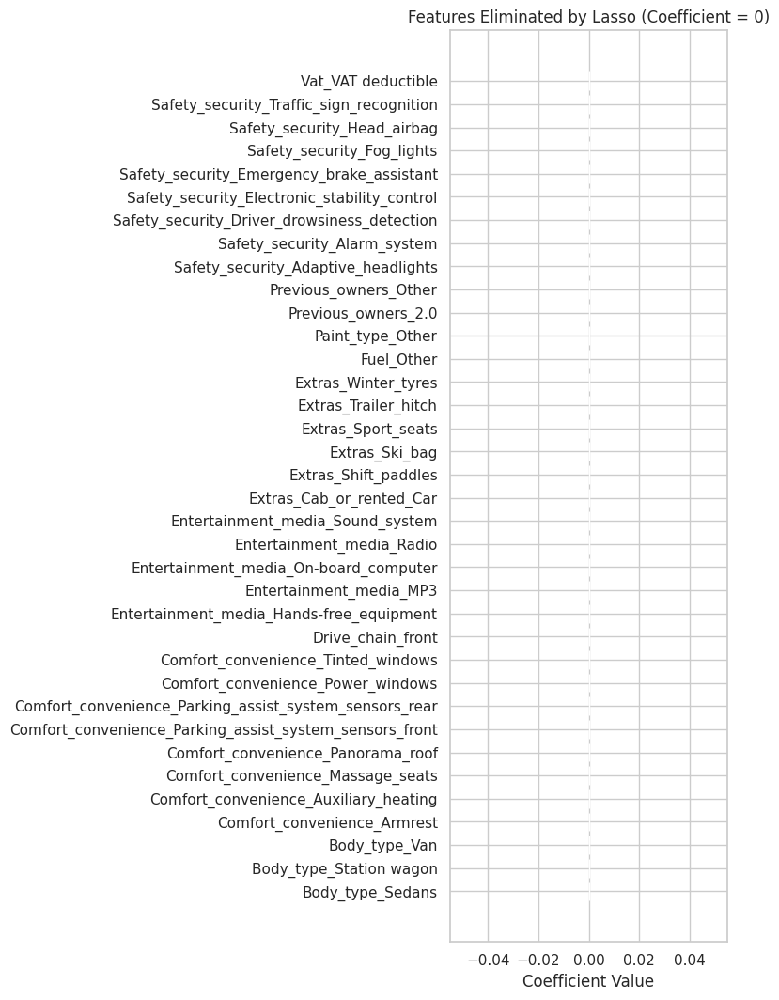

In [125]:
# Filter eliminated features
lasso_zero = coef_df[coef_df['Lssso_BestAlpha_Coefficient'] == 0]

# Plot eliminated features
plt.figure(figsize=(8, len(lasso_zero) * 0.3))
plt.barh(lasso_zero['Feature'], [0]*len(lasso_zero), color='gray')
plt.title("Features Eliminated by Lasso (Coefficient = 0)")
plt.xlabel("Coefficient Value")
plt.tight_layout()
plt.show()


In [126]:
#Identify comman features eliminated by most models
# Define thresholds
near_zero_threshold = 0.001

# 1. Features eliminated by Lasso
lasso_zero = coef_df[coef_df['Lssso_BestAlpha_Coefficient'] == 0]['Feature']

# 2. Features dropped in VIF-pruned model
vif_dropped = coef_df[coef_df['Linear_Regression_ViF_Coefficient'].isna()]['Feature']

# 3. Features with near-zero Ridge coefficients
ridge_near_zero = coef_df[np.abs(coef_df['Riddge_BestAlpha_Coefficient']) < near_zero_threshold]['Feature']

# 4. Find common features across all three
common_eliminated = set(lasso_zero) & set(vif_dropped) & set(ridge_near_zero)

# Display results
print("Commonly Eliminated Features Across Models:")
for feature in sorted(common_eliminated):
    print(f"• {feature}")


Commonly Eliminated Features Across Models:
• Entertainment_media_On-board_computer
• Entertainment_media_Radio


## **4 Conclusion & Key Takeaways**  <font color =red> [10 marks] </font>

What did you notice by performing regularisation? Did the model performance improve? If not, then why? Did you find overfitting or not? Was the data sufficent? Is a linear model sufficient?

#### **4.1 Conclude with outcomes and insights gained** <font color =red> [10 marks] </font>

In [127]:
results

,Model,R2,MAE,MSE,RMSE,Adjusted R2
0,Linear_Regression_Base_train,0.930,0.077,0.011,0.105,0.930
1,Linear_Regression_Base_test,0.931,0.076,0.011,0.104,0.928
2,Linear_Regression_ViF_train,0.910,0.088,0.014,0.119,0.910
3,Linear_Regression_ViF_test,0.912,0.086,0.014,0.117,0.909
4,Riddge_BestAlpha_train,0.930,0.077,0.011,0.105,0.930
5,Riddge_BestAlpha_test,0.931,0.076,0.011,0.104,0.928
6,Lssso_BestAlpha_train,0.928,0.078,0.011,0.107,0.928
7,Lssso_BestAlpha_test,0.928,0.077,0.011,0.106,0.925


1. MODEL PERFORMANCE COMPARISON

  

*   R², Adjusted R², RMSE, and MAE stayed almost identical across Linear, Ridge, and Lasso.
*  The baseline linear model was already capturing the variance well, and the dataset didn’t suffer from severe overfitting.

* Improvement was qualitative, not quantitative: Ridge and Lasso improved stability, interpretability, and robustness, even if raw accuracy didn’t jump.

---

2. REGULARIZATION EFFECTS
Ridge and Lasso provided minimal performance gains
Possible reasons:
  - Data already well-behaved
  - Multicollinearity not severely impacting predictions
  - Feature selection by Lasso didn't help much

---

3. OVERFITTING ANALYSIS

**No overfitting detected.**

* Train and test metrics were nearly identical.

* Residuals were symmetrically distributed and centered around zero.

*  Q‑Q plots showed only mild tail deviations, not enough to invalidate assumptions.
---

4. DATA SUFFICIENCY
**Data was Sufficent**
*  With ~16k rows and 23 columns, the dataset was large enough to train and validate regression models.

*  The mix of numerical and categorical predictors provided rich signals.

*  Some imbalance existed (e.g., metallic paint, VAT deductible, used cars), but these were handled via grouping and encoding.

---
5. Is Linear Model Sufficent

*  Regularisation didn’t boost raw performance because the baseline model was already strong.

*  Its real value was in improving interpretability, reducing multicollinearity, and highlighting the most impactful features.

*  No overfitting was found, and the dataset was sufficient.

*  Linear models are sufficient for explainability and business storytelling, while tree‑based models could be explored if predictive power becomes the top priority.


**Conclusion**

The analysis confirms that car prices are primarily driven by a balance of depreciation factors (age and mileage) and performance attributes (horsepower, weight), with brand reputation, luxury features, and trust signals such as inspection status and ownership history acting as strong multipliers. Regularisation (Ridge, Lasso) did not significantly improve raw performance metrics, as the baseline linear model was already robust and free from overfitting, but it enhanced stability, interpretability, and feature selection. With a dataset of over 15,000 vehicles, the sample was sufficient to build reliable models, and a linear approach remains appropriate for both predictive accuracy and stakeholder explainability.